In [1]:
!pip install tensorflow_probability


In [2]:
!pip install --upgrade tensorflow


In [6]:
!pip install tqdm
!pip install xgboost

  Obtaining dependency information for xgboost from https://files.pythonhosted.org/packages/bc/43/242432efc3f60052a4a534dc4926b21e236ab4ec8d4920c593da3f65c65d/xgboost-2.0.2-py3-none-win_amd64.whl.metadata
  Using cached xgboost-2.0.2-py3-none-win_amd64.whl.metadata (2.0 kB)
  Obtaining dependency information for scipy from https://files.pythonhosted.org/packages/43/d0/f3cd75b62e1b90f48dbf091261b2fc7ceec14a700e308c50f6a69c83d337/scipy-1.11.4-cp311-cp311-win_amd64.whl.metadata
     ---------------------------------------- 0.0/60.4 kB ? eta -:--:--
     ------------ ------------------------- 20.5/60.4 kB 682.7 kB/s eta 0:00:01
     -------------------------------------- 60.4/60.4 kB 809.0 kB/s eta 0:00:00
Using cached xgboost-2.0.2-py3-none-win_amd64.whl (99.8 MB)
   ---------------------------------------- 0.0/44.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/44.1 MB 1.9 MB/s eta 0:00:23
   ---------------------------------------- 0.5/44.1 MB 6.2 MB/s eta 0:00:08
   -

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import xgboost as xgb
import tensorflow as tf
import tensorflow_probability as tfp
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import warnings
warnings.filterwarnings("ignore")

In [9]:
data = pd.read_csv('Data_final.csv')

In [10]:
data.head()

,m49_code,country,region,cpc_code,commodity,year,loss_percentage,loss_percentage_original,loss_quantity,activity,food_supply_stage,treatment,cause_of_loss,sample_size,method_data_collection,reference,url,notes
0,104,Myanmar,NaN,23161.02,"Rice, milled",2015,1.78,1.78%,26.12kgs,Storage,Storage,"30 days storage, with trapping",Rodents,NaN,Controlled Experiment,"Dr Steven Belmain (2015), context post-harvest...",NaN,Reference has been generated automatically
1,104,Myanmar,NaN,23161.02,"Rice, milled",2015,11.77,11.77%,88.18kgs,Storage,Storage,"60 days storage, no trapping",Rodents,NaN,Controlled Experiment,"Dr Steven Belmain (2015), context post-harvest...",NaN,Reference has been generated automatically
2,104,Myanmar,NaN,23161.02,"Rice, milled",2015,5.88,5.88%,44.09kgs,Storage,Storage,"30 days storage, no trapping",Rodents,NaN,Controlled Experiment,"Dr Steven Belmain (2015), context post-harvest...",NaN,Reference has been generated automatically
3,104,Myanmar,NaN,23161.02,"Rice, milled",2015,3.57,3.57%,52.24kgs,Storage,Storage,"60 days storage, with trapping",Rodents,NaN,Controlled Experiment,"Dr Steven Belmain (2015), context post-harvest...",NaN,Reference has been generated automatically
4,104,Myanmar,NaN,23161.02,"Rice, milled",2015,17.65,17.65%,132.27kgs,Storage,Storage,"90 days storage, no trapping",Rodents,NaN,Controlled Experiment,"Dr Steven Belmain (2015), context post-harvest...",NaN,Reference has been generated automatically


## Preprocessing

In [11]:
# Lowercasing all country names

for col in ['country', 'commodity', 'activity', 'food_supply_stage', 'cause_of_loss', 'method_data_collection', 'treatment']:
    data[col] = data[col].str.strip().str.lower()


# Sorting data by year in ascending order

data.sort_values(by = ['year'], ascending = True, inplace = True)


# Dropping irrelevant columns

data.drop(columns = ['m49_code', 'cpc_code', 'loss_percentage_original', 'reference', 'url',
                           'notes'], inplace = True)

In [12]:
# Splitting the dataframe into country level and continent level data

continent_level_data = data[data.country.isin(['asia', 'africa', 'north america', 'europe', 'south america', 'australia and new zealand'])].reset_index(drop = True)

country_level_data = data[~data.country.isin(['asia', 'africa', 'north america', 'europe', 'south america', 'australia and new zealand'])].reset_index(drop = True)

### Cases with data collection methods other than modelled estimates

In [13]:
non_modelled_estimates = country_level_data[country_level_data.method_data_collection != "modelled estimates"]

In [14]:
non_modelled_estimates.shape

(8408, 12)

In [15]:
# Wherever food supply stage is not present, appending activity to that

non_modelled_estimates.food_supply_stage = np.where(non_modelled_estimates.food_supply_stage.isnull(),
                                                   non_modelled_estimates.activity,
                                                   non_modelled_estimates.food_supply_stage)

In [16]:
# Grouping the data using the key - {country, commodity, year, food supply stage} and obtaining time series length for each group

grouped_nm_estimates = non_modelled_estimates.groupby(['country', 'commodity', 'year', 'food_supply_stage']).agg({'loss_percentage':np.mean,
                                                                                            'cause_of_loss':pd.Series.mode}).reset_index()

grouped_nm_estimates['main_key'] = grouped_nm_estimates['country'] + '_' + grouped_nm_estimates['commodity'] + '_' + grouped_nm_estimates['food_supply_stage']

num_unique_years_nm = grouped_nm_estimates.groupby(['country', 'commodity', 'food_supply_stage']).year.nunique().reset_index()
num_unique_years_nm['key'] = num_unique_years_nm['country'] + '_' + num_unique_years_nm['commodity'] + '_' + num_unique_years_nm['food_supply_stage']

In [17]:
# Total number of data points for significant keys (over 5 unique years)

num_unique_years_nm[num_unique_years_nm.year>=5].year.sum()

2551

In [18]:
grouped_nm_estimates.head()

,country,commodity,year,food_supply_stage,loss_percentage,cause_of_loss,main_key
0,algeria,potatoes,1991,whole supply chain,10.000000,[],algeria_potatoes_whole supply chain
1,algeria,potatoes,2005,whole supply chain,25.000000,[],algeria_potatoes_whole supply chain
2,argentina,potatoes,1991,whole supply chain,8.000000,[],argentina_potatoes_whole supply chain
3,argentina,soya beans,2019,storage,0.503077,[],argentina_soya beans_storage
4,armenia,apples,2009,farm,47.000000,[],armenia_apples_farm


In [19]:
# Only keeping those keys at least 5 data points (5 years of data)

num_unique_years_nm = num_unique_years_nm[num_unique_years_nm.year>=5]

final_data = grouped_nm_estimates[grouped_nm_estimates['main_key'].isin(num_unique_years_nm['key'].unique())].reset_index(drop = True).sort_values(by = 'year', ascending = True).reset_index(drop = True)

In [20]:
# Checking whether there is a minimum amount of variation in loss percentage values

num_unique_loss_percentages = final_data.groupby(['main_key']).loss_percentage.nunique().reset_index()
good_keys = list(num_unique_loss_percentages[num_unique_loss_percentages.loss_percentage>1].main_key.unique())

In [21]:
# Keeping only those keys where more than 2 unique values are present in the time series

final_reliable_data = final_data[final_data.main_key.isin(good_keys)].reset_index(drop = True)

In [22]:
final_reliable_data.shape

(598, 7)

In [23]:
final_reliable_data.main_key.nunique()

44

In [24]:
final_reliable_data.head()

,country,commodity,year,food_supply_stage,loss_percentage,cause_of_loss,main_key
0,pakistan,wheat,1966,storage,12.00,public sector storage losses due to rodents,pakistan_wheat_storage
1,kenya,maize (corn),1969,storage,14.25,[],kenya_maize (corn)_storage
2,ghana,maize (corn),1969,storage,12.75,[],ghana_maize (corn)_storage
3,united states of america,"hen eggs in shell, fresh",1970,whole supply chain,2.17,[],"united states of america_hen eggs in shell, fr..."
4,united states of america,lettuce and chicory,1970,whole supply chain,8.50,[],united states of america_lettuce and chicory_w...


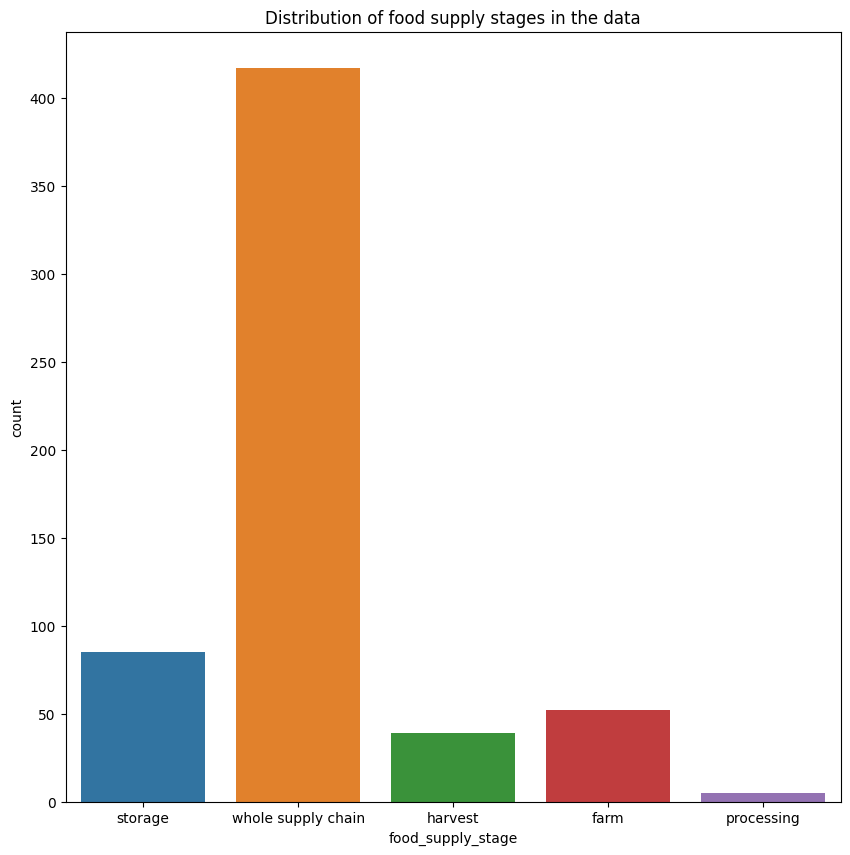

In [25]:
plt.figure(figsize = (10,10))
plt.title('Distribution of food supply stages in the data')
sns.countplot(x = final_reliable_data.food_supply_stage)
plt.show()

In [26]:
final_reliable_data.head()

,country,commodity,year,food_supply_stage,loss_percentage,cause_of_loss,main_key
0,pakistan,wheat,1966,storage,12.00,public sector storage losses due to rodents,pakistan_wheat_storage
1,kenya,maize (corn),1969,storage,14.25,[],kenya_maize (corn)_storage
2,ghana,maize (corn),1969,storage,12.75,[],ghana_maize (corn)_storage
3,united states of america,"hen eggs in shell, fresh",1970,whole supply chain,2.17,[],"united states of america_hen eggs in shell, fr..."
4,united states of america,lettuce and chicory,1970,whole supply chain,8.50,[],united states of america_lettuce and chicory_w...


### WordCloud for Cause of Loss

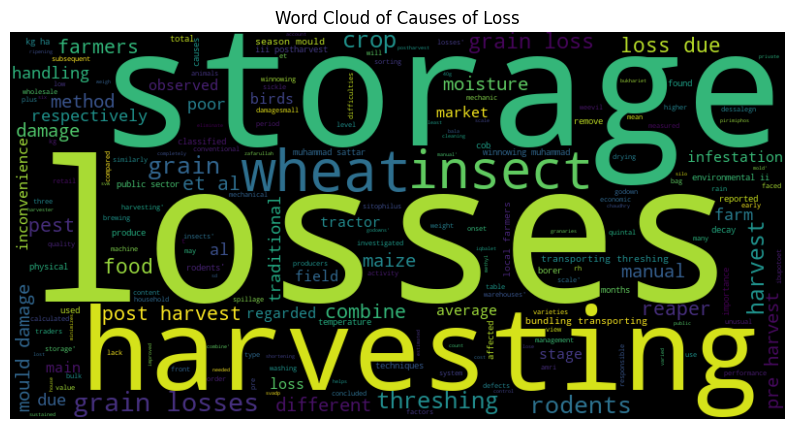

In [29]:
from wordcloud import WordCloud
text = ' '.join(final_reliable_data['cause_of_loss'].astype(str))

wordcloud = WordCloud(width=800, height=400, background_color='black').generate(text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') 
plt.title('Word Cloud of Causes of Loss')
plt.show()  

In [38]:
final_reliable_data['commodity'].unique()

array(['wheat', 'maize (corn)', 'hen eggs in shell, fresh',
       'lettuce and chicory', 'other beans, green', 'potatoes',
       'cabbages', 'carrots and turnips', 'rice', 'yams', 'orange juice',
       'grapefruit juice', 'tomatoes', 'mangoes, guavas and mangosteens',
       'cauliflowers and broccoli', 'soya beans',
       'meat of goat, fresh or chilled', 'onions and shallots, green',
       'oats', 'eggs, dried', 'grapes'], dtype=object)

In [32]:
country_text = ' '.join(final_reliable_data[final_reliable_data['country'] == 'pakistan']['cause_of_loss'].astype(str))

#### Generate word cloud for country-based causes of loss

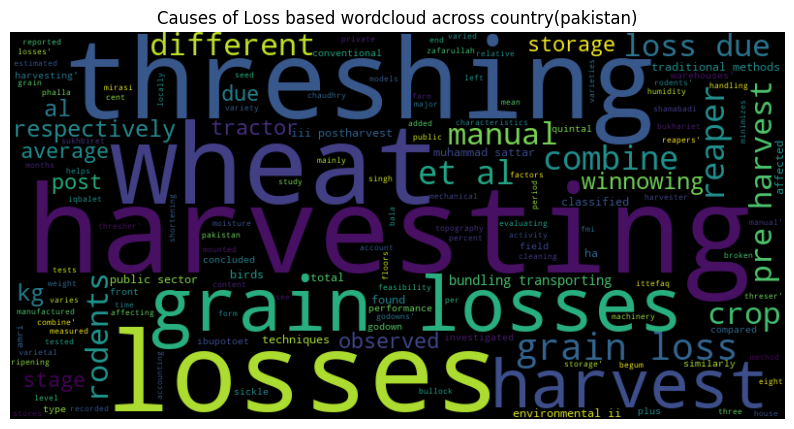

In [41]:
country_wordcloud = WordCloud(width=800, height=400, background_color='black').generate(country_text)
plt.figure(figsize=(10, 6))
plt.imshow(country_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Causes of Loss based wordcloud across country(pakistan)')
plt.show()

#### Generate word cloud for commodity-based causes of loss

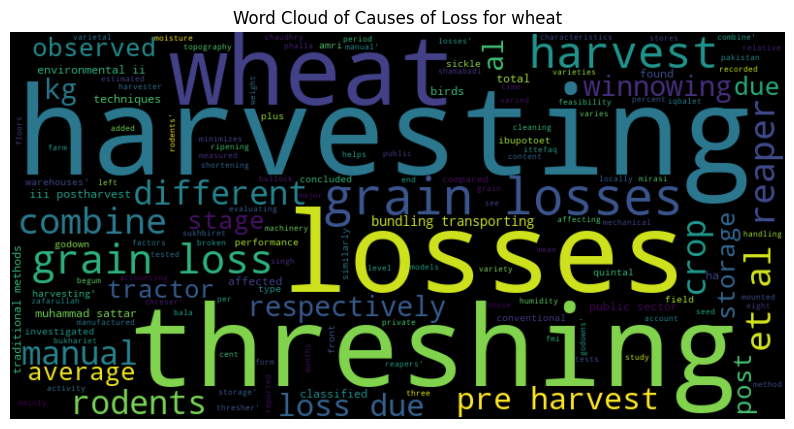

In [40]:
commodity_text =  ' '.join(final_reliable_data[final_reliable_data['commodity'] == 'wheat']['cause_of_loss'].astype(str))
commodity_wordcloud = WordCloud(width=800, height=400, background_color='black').generate(commodity_text)
plt.figure(figsize=(10, 6))
plt.imshow(commodity_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Causes of Loss for wheat')
plt.show()

In [72]:
unique_countries = final_reliable_data['country'].unique().tolist()

In [73]:
print(type(unique_countries))


<class 'list'>


In [63]:
final_reliable_data['country'].unique()

array(['pakistan', 'kenya', 'ghana', 'united states of america', 'malawi',
       'benin', 'india', 'united republic of tanzania', 'china',
       'indonesia', 'ethiopia', 'azerbaijan'], dtype=object)

In [65]:
empty_cause_of_loss = final_reliable_data[final_reliable_data['country'] == '']['cause_of_loss']
print(empty_cause_of_loss)

Series([], Name: cause_of_loss, dtype: object)


In [71]:
print(final_reliable_data['cause_of_loss'].value_counts())

cause_of_loss
pests                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [78]:
final_reliable_data[final_reliable_data['country'] == 'united_states_of_america']['cause_of_loss'].isnull() | (final_reliable_data[final_reliable_data['country'] == 'united_states_of_america']['cause_of_loss'] == '')


Series([], Name: cause_of_loss, dtype: bool)

#### WordCloud for Country based cause of losses

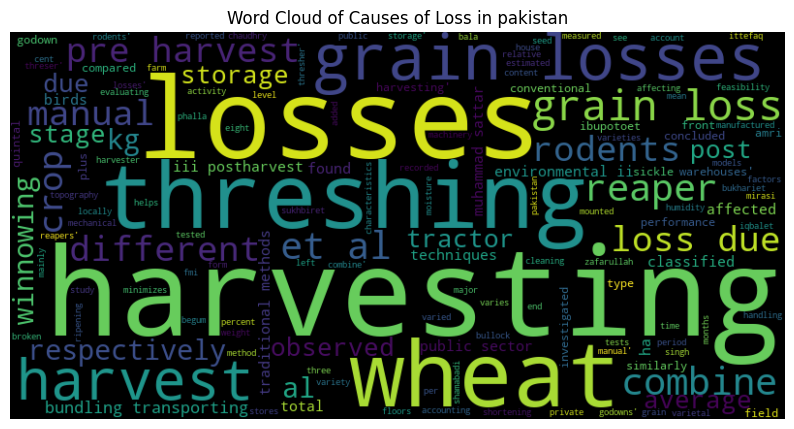

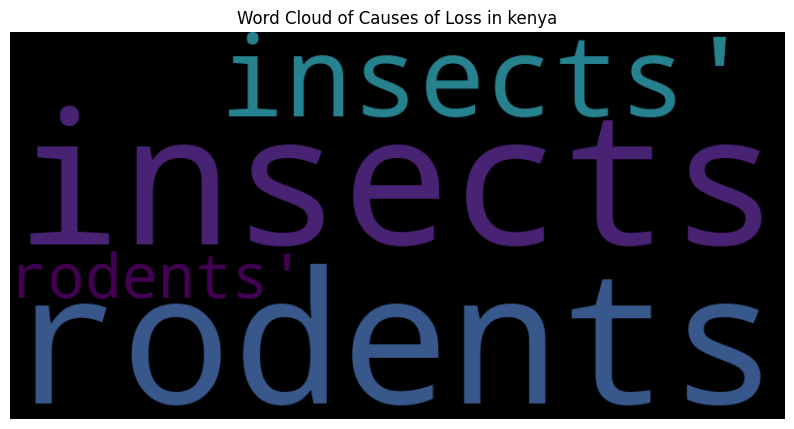

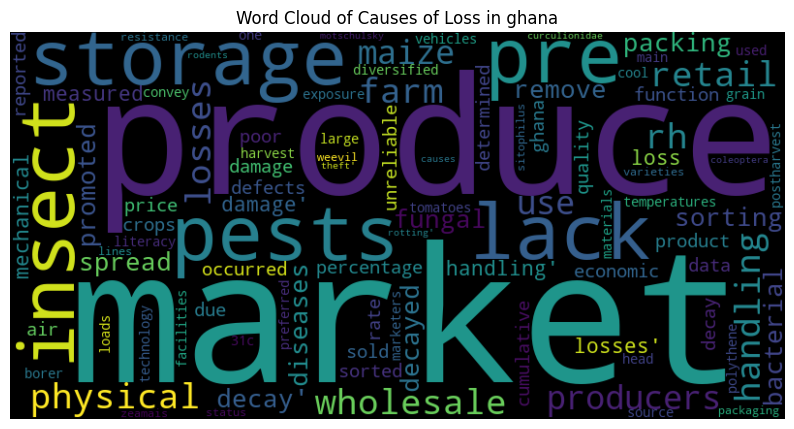

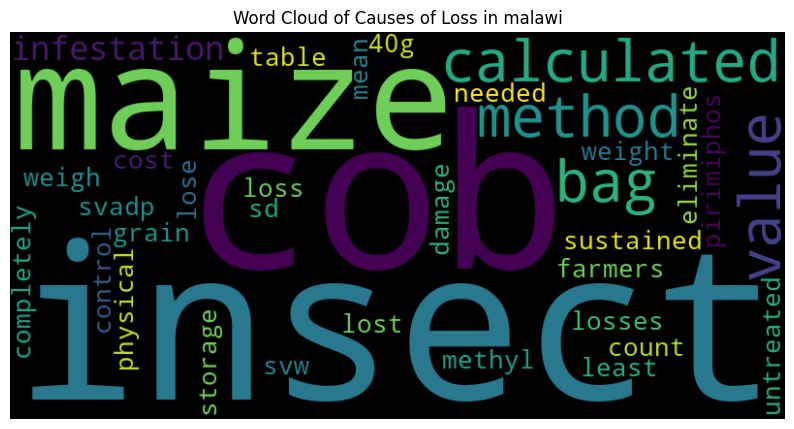

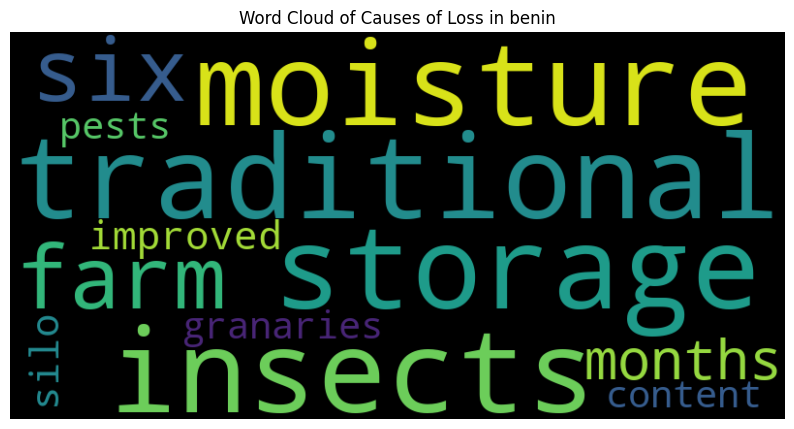

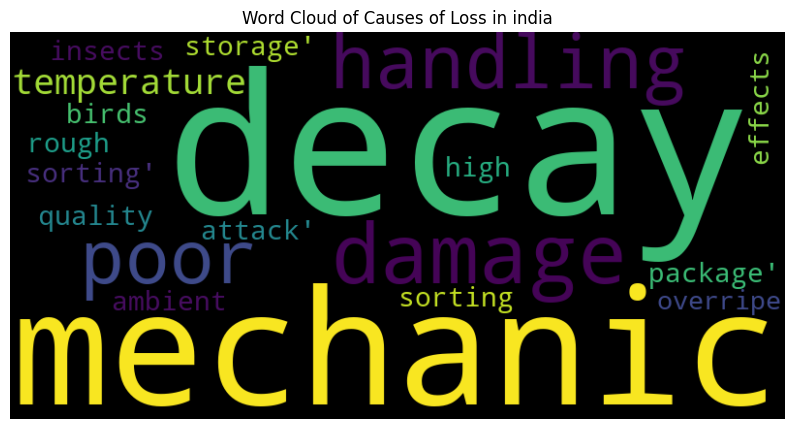

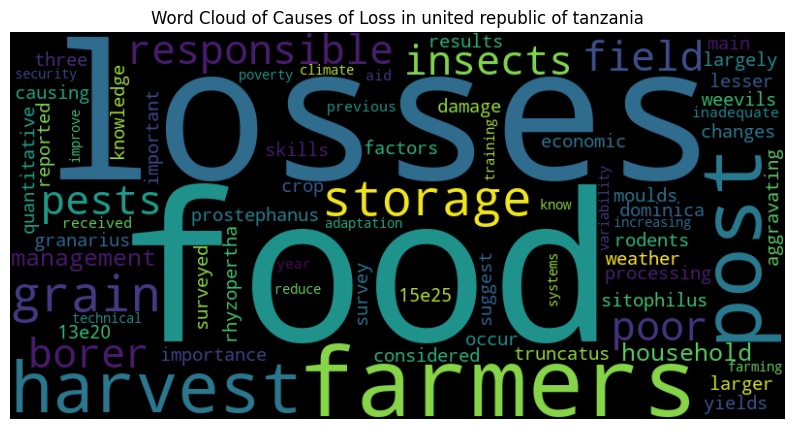

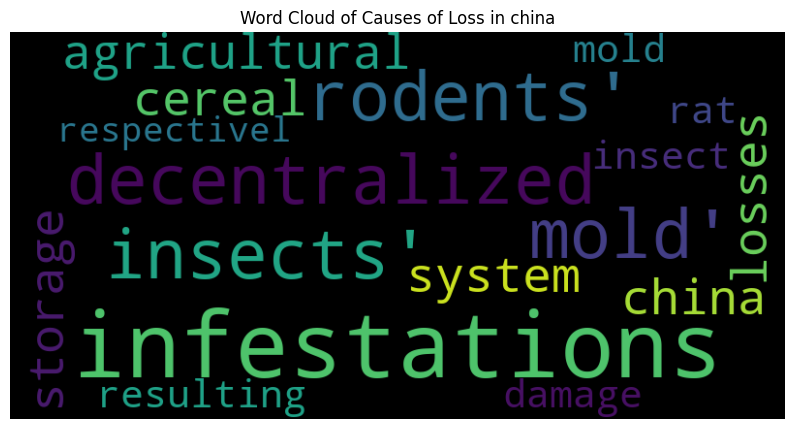

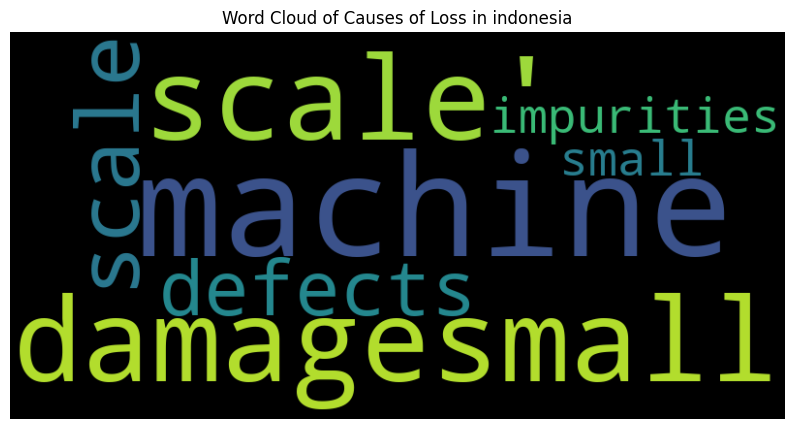

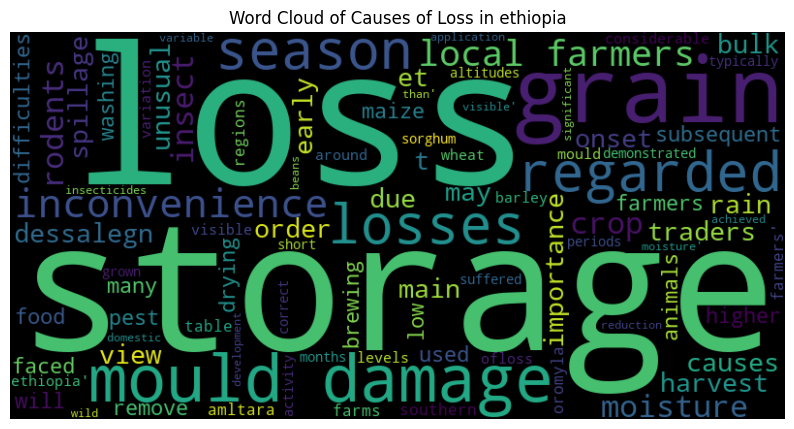

In [79]:
for country in final_reliable_data.country.unique(): 
    try:
        country_text = ' '.join(final_reliable_data[final_reliable_data.country == country]['cause_of_loss'].astype(str))
        country_wordcloud = WordCloud(width=800, height=400, background_color='black').generate(country_text)
        plt.figure(figsize=(10, 6))
        plt.imshow(country_wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud of Causes of Loss in {country}')
        plt.show()
    except:
        pass    


### Loss Percentage Across Countries and Commodities

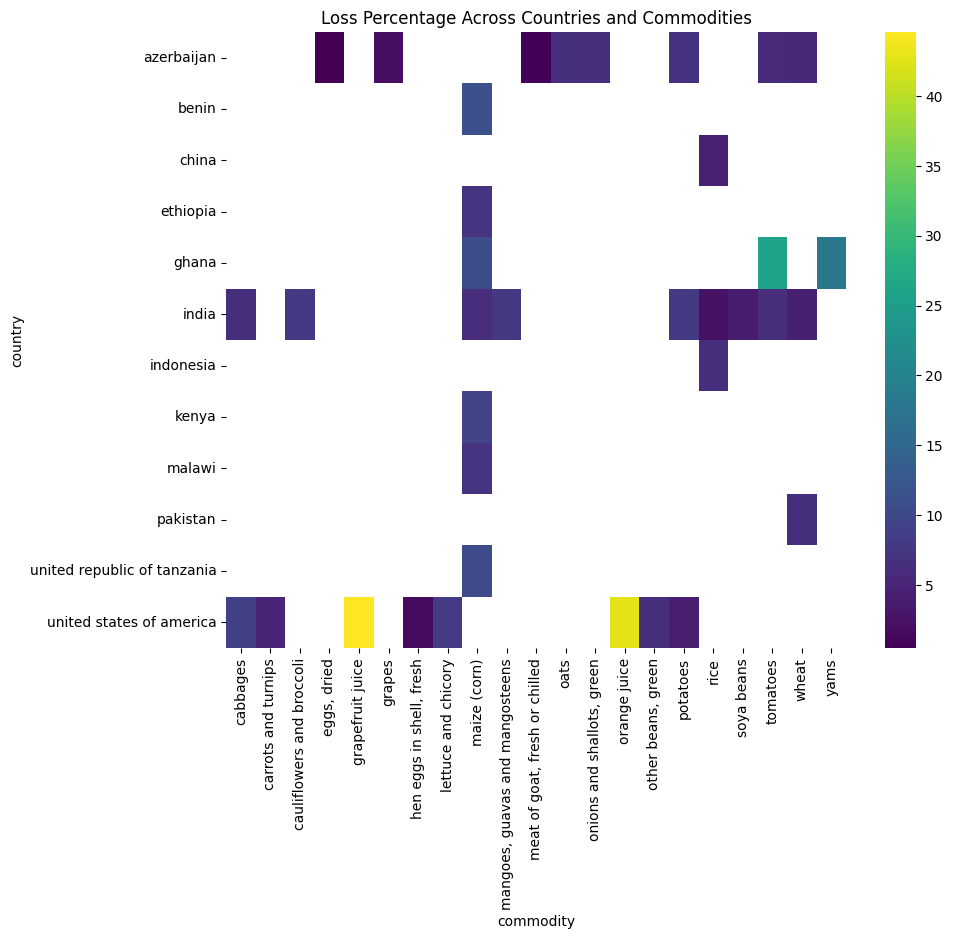

In [28]:
hmap = final_reliable_data.pivot_table(index='country', columns='commodity', values='loss_percentage')
plt.figure(figsize=(10, 8))
sns.heatmap(hmap, cmap='viridis')
plt.title('Loss Percentage Across Countries and Commodities')
plt.show()

#### Word Cloud for commodity based cause of losses

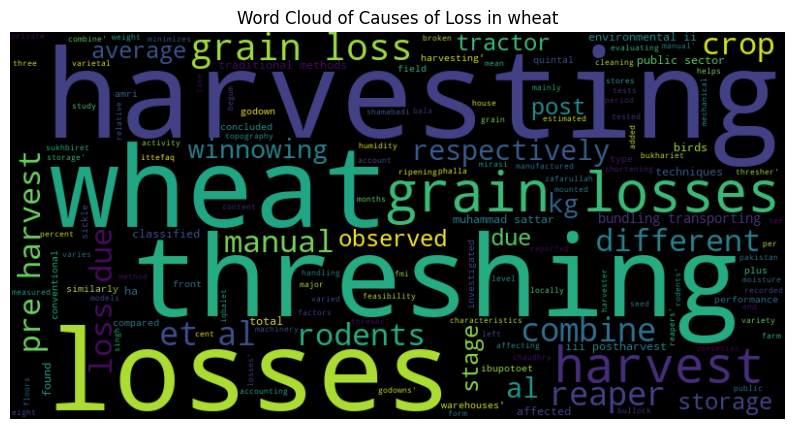

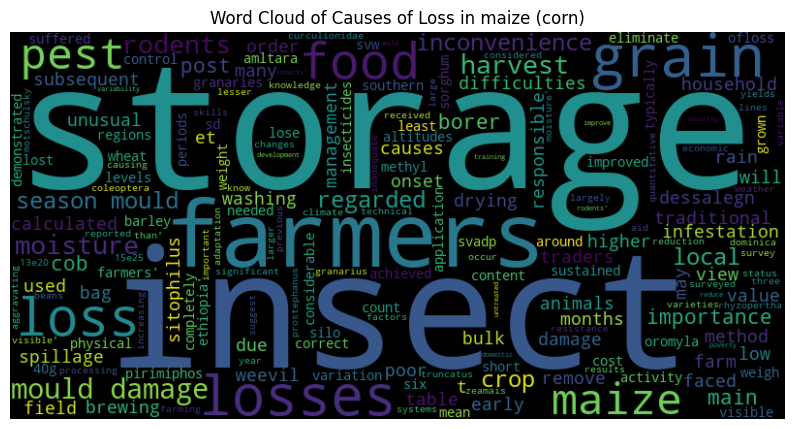

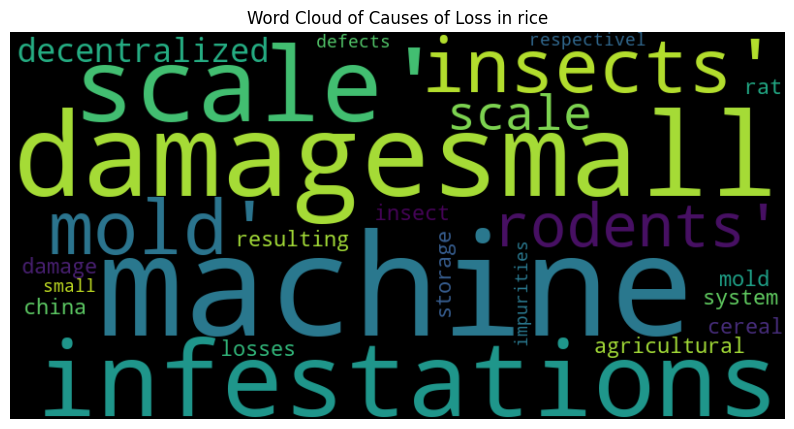

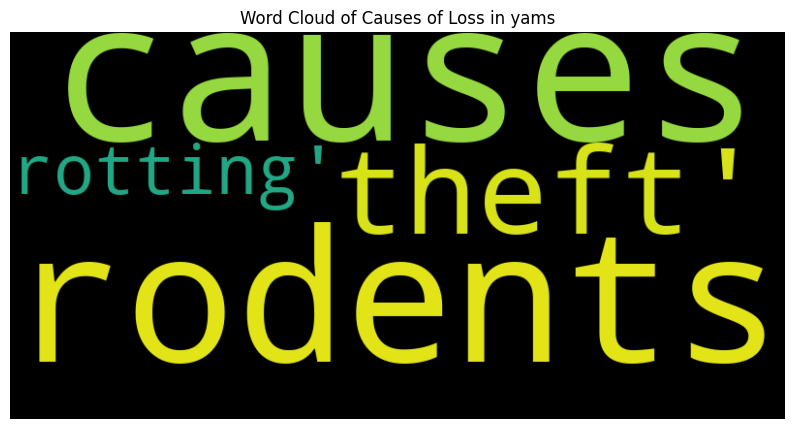

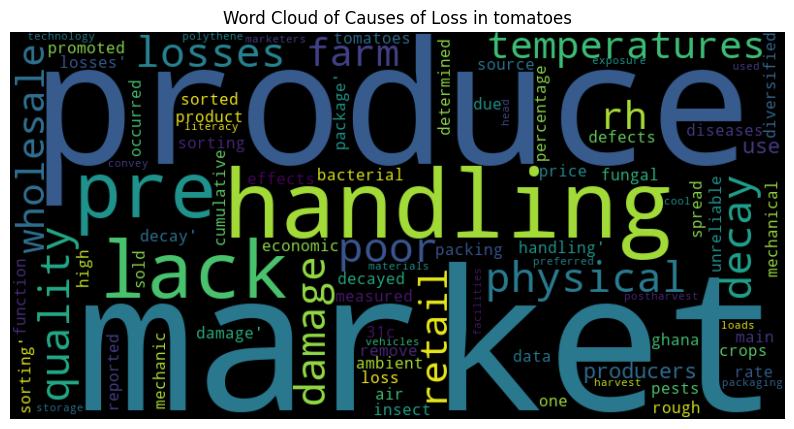

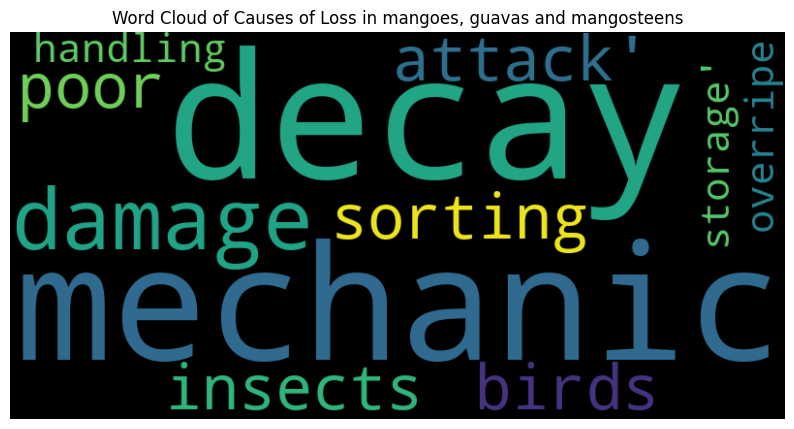

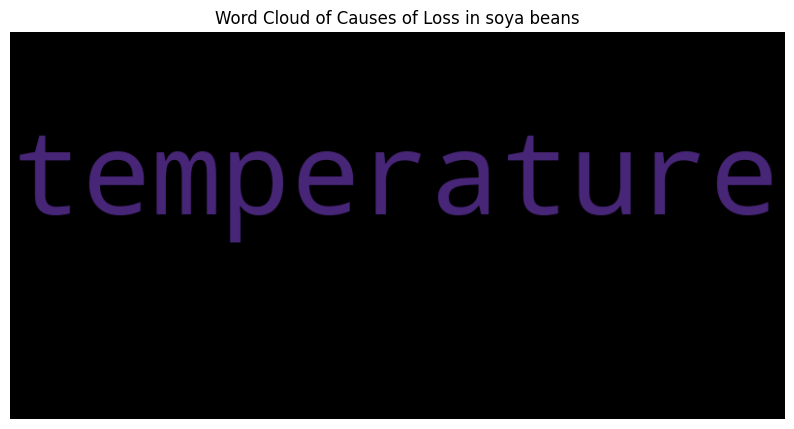

In [80]:
for commodity in final_reliable_data.commodity.unique(): 
    try:
        country_text = ' '.join(final_reliable_data[final_reliable_data.commodity == commodity]['cause_of_loss'].astype(str))
        country_wordcloud = WordCloud(width=800, height=400, background_color='black').generate(country_text)
        plt.figure(figsize=(10, 6))
        plt.imshow(country_wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud of Causes of Loss in {commodity}')
        plt.show()
    except:
        pass    


# Modelling

#### Plotting all keys

In [22]:
final_reliable_data.shape

(598, 7)

In [23]:
final_reliable_data.head()

,country,commodity,year,food_supply_stage,loss_percentage,cause_of_loss,main_key
0,pakistan,wheat,1966,storage,12.00,public sector storage losses due to rodents,pakistan_wheat_storage
1,kenya,maize (corn),1969,storage,14.25,[],kenya_maize (corn)_storage
2,ghana,maize (corn),1969,storage,12.75,[],ghana_maize (corn)_storage
3,united states of america,"hen eggs in shell, fresh",1970,whole supply chain,2.17,[],"united states of america_hen eggs in shell, fr..."
4,united states of america,lettuce and chicory,1970,whole supply chain,8.50,[],united states of america_lettuce and chicory_w...


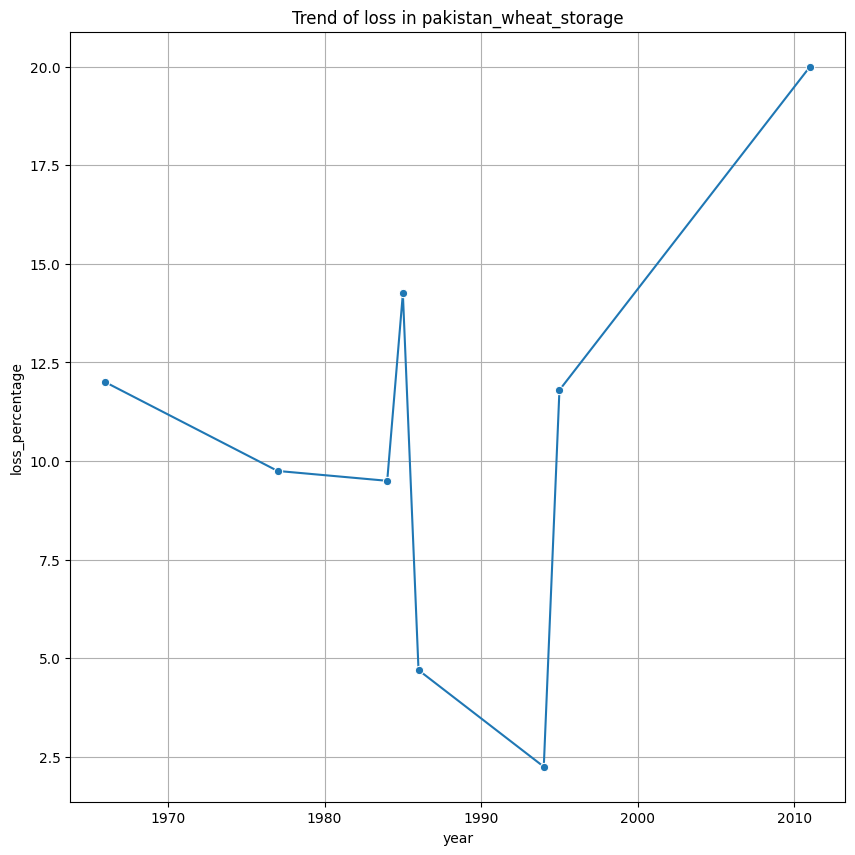

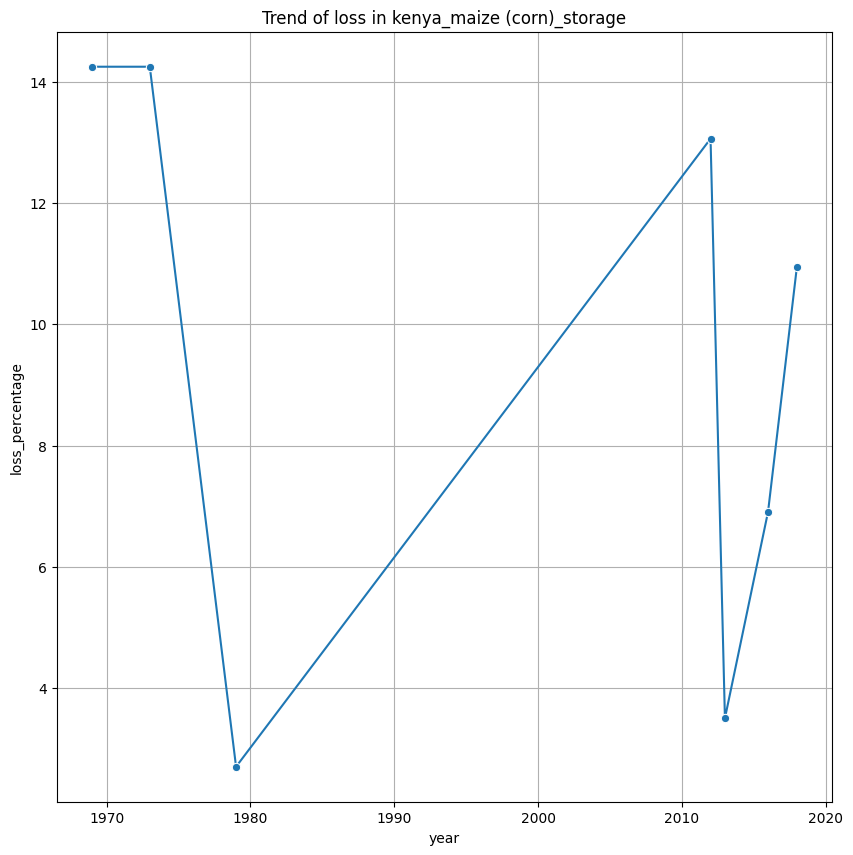

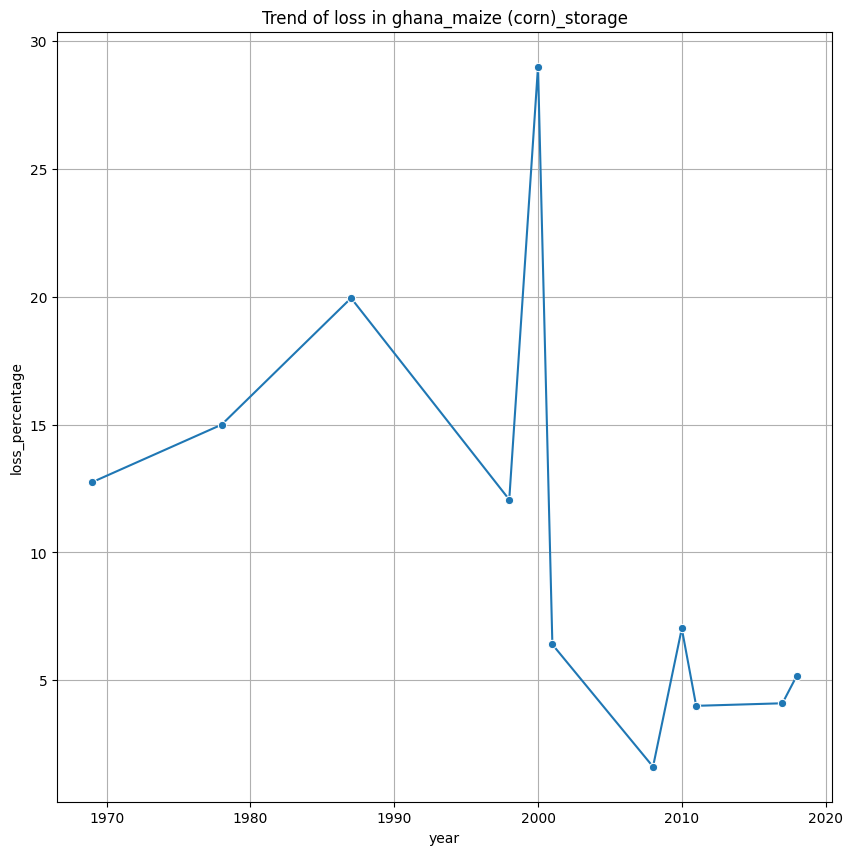

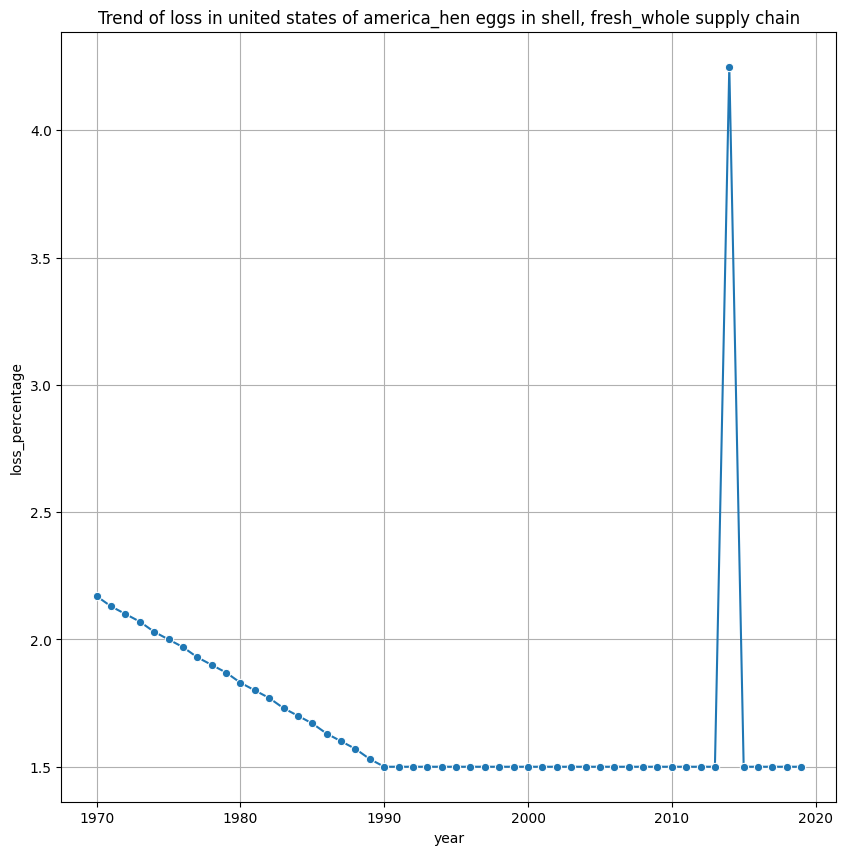

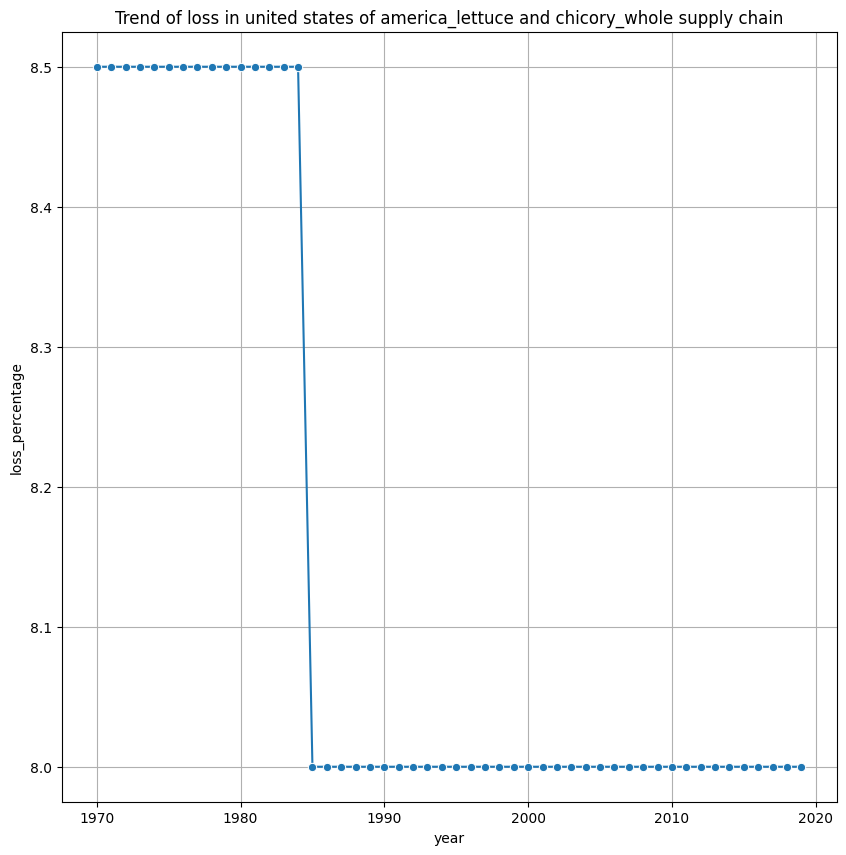

...

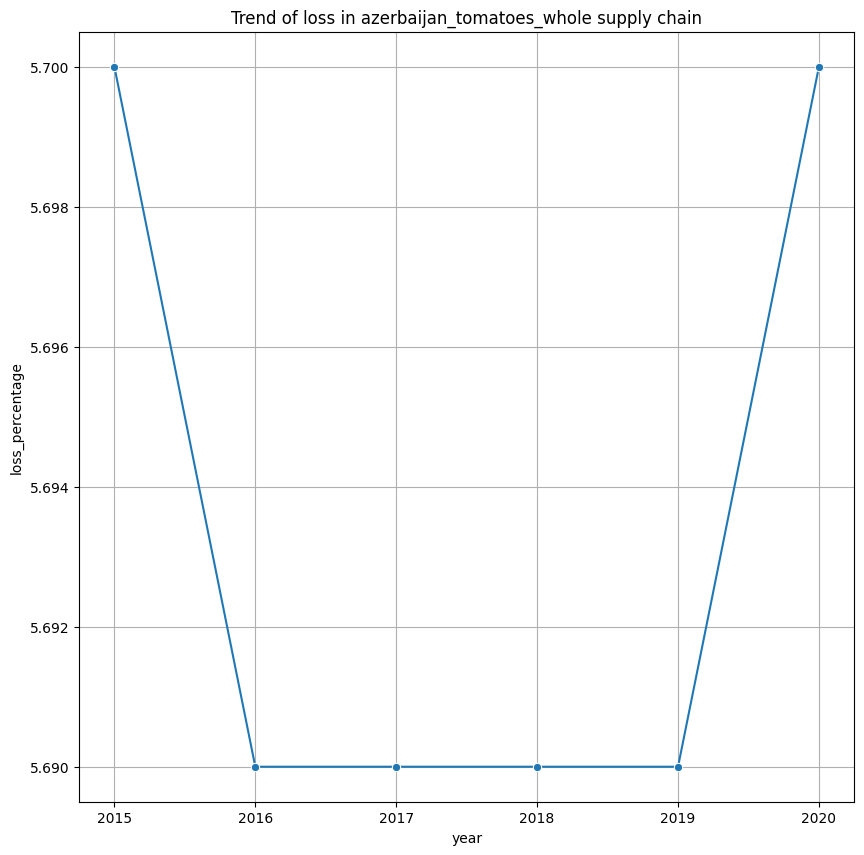

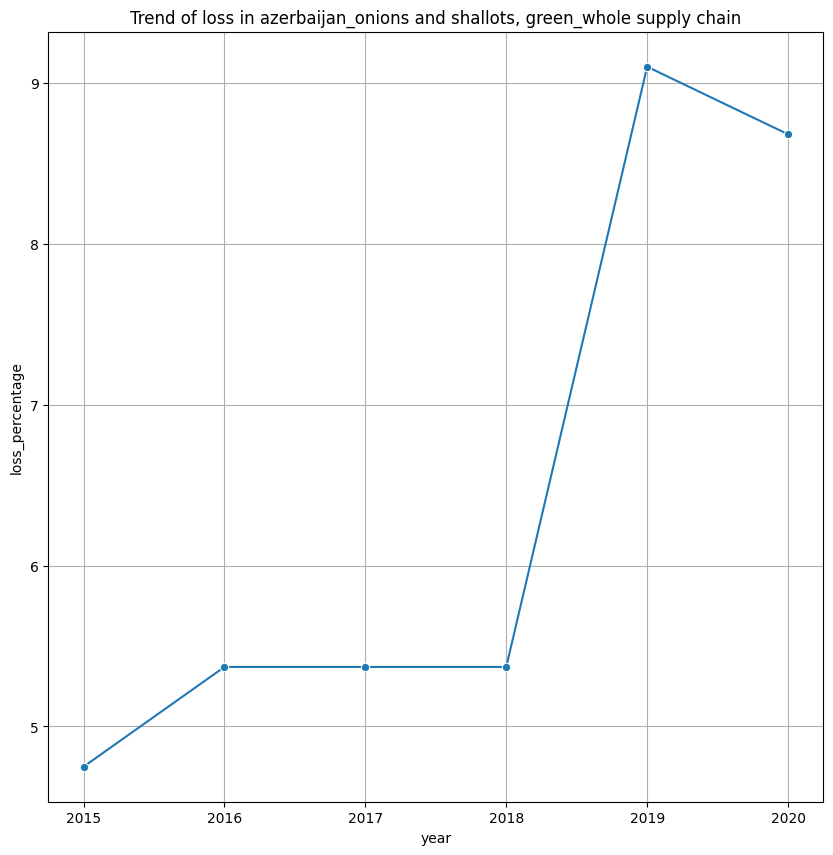

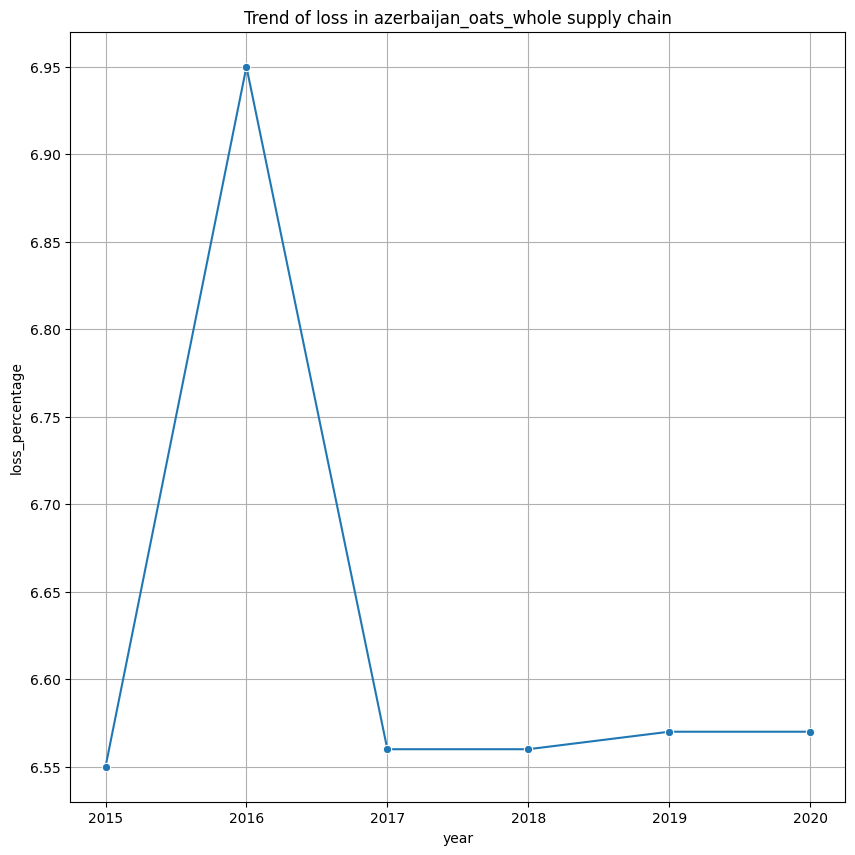

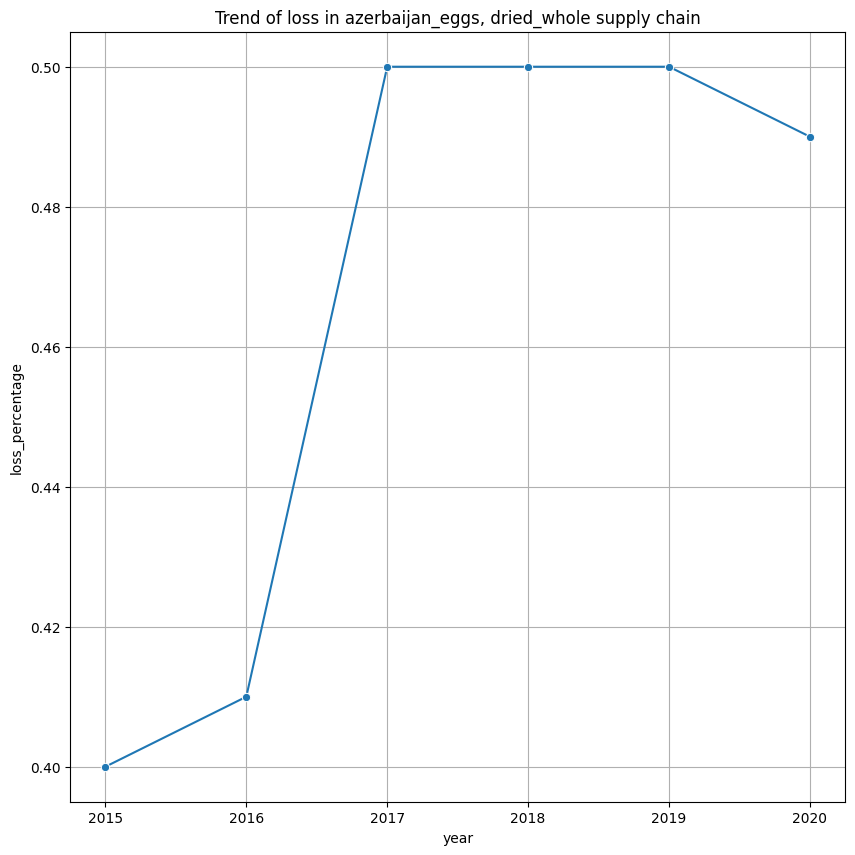

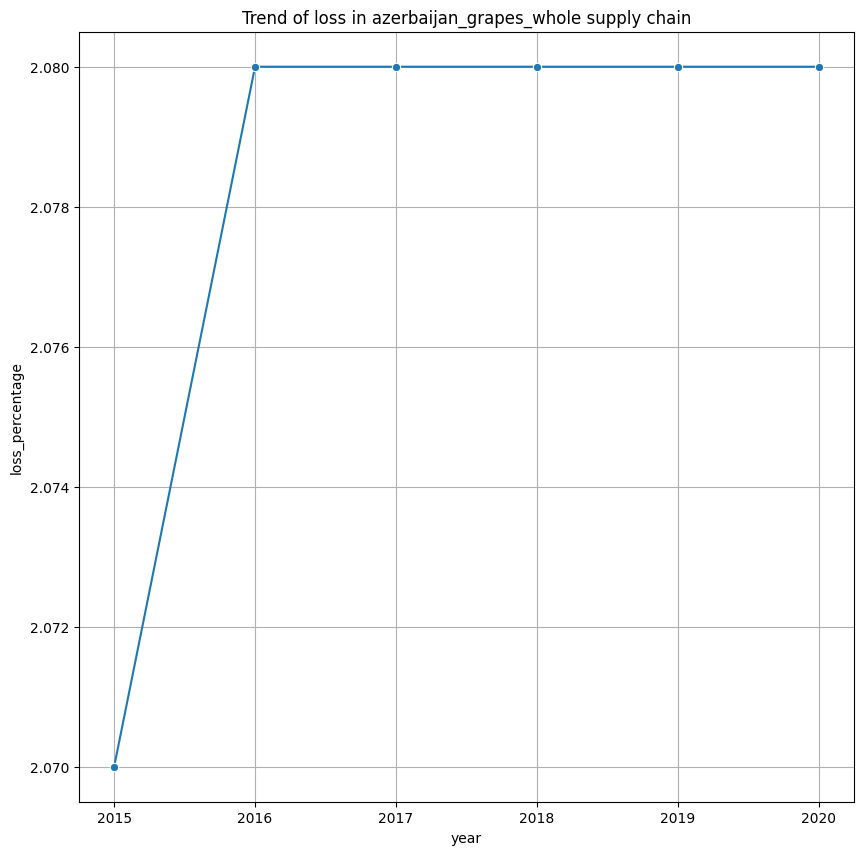

In [24]:
for key in final_reliable_data.main_key.unique():
    key_data = final_reliable_data[final_reliable_data.main_key == key]
    plt.figure(figsize = (10,10))
    plt.title('Trend of loss in '+key)
    sns.lineplot(x = key_data.year, y = key_data.loss_percentage, marker = "o")
    plt.grid()
    plt.show()

#### Plotting for countries

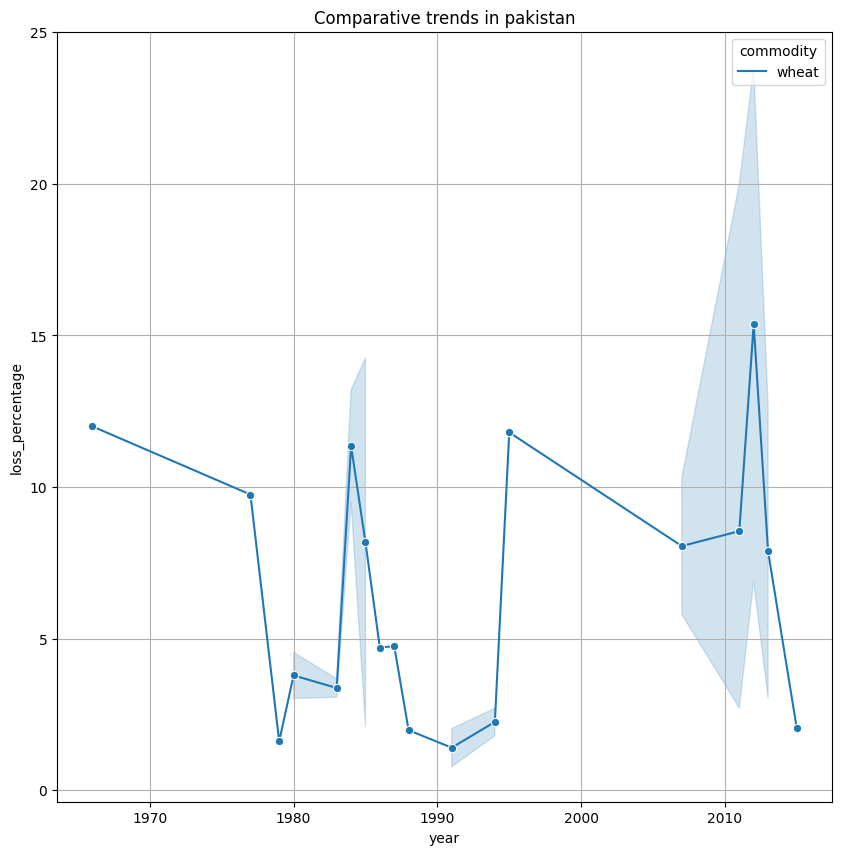

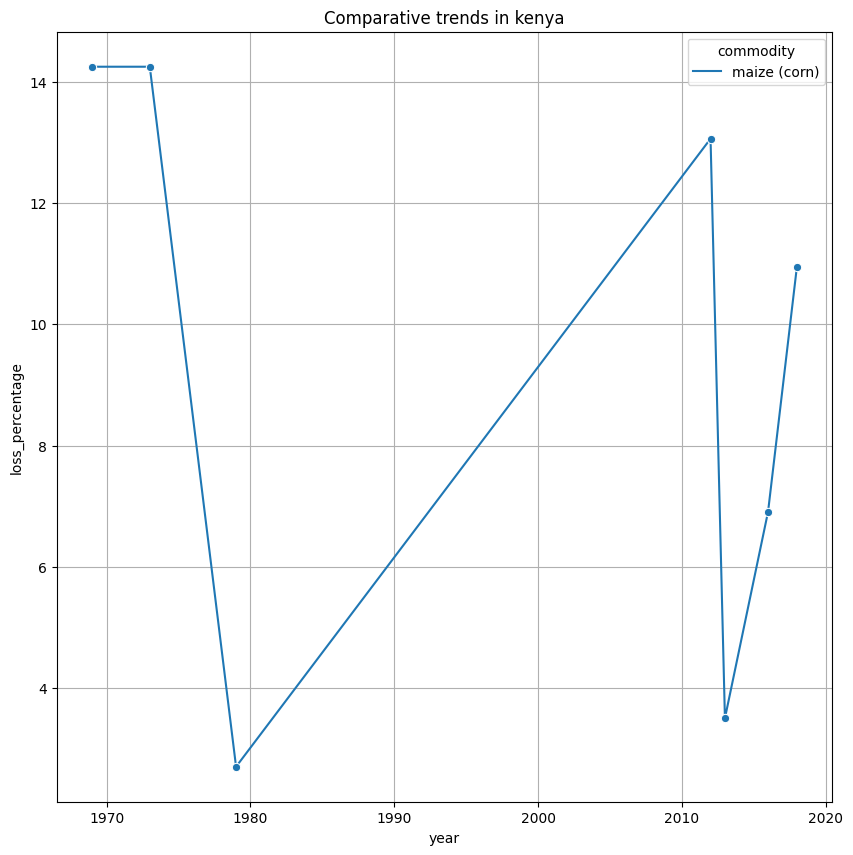

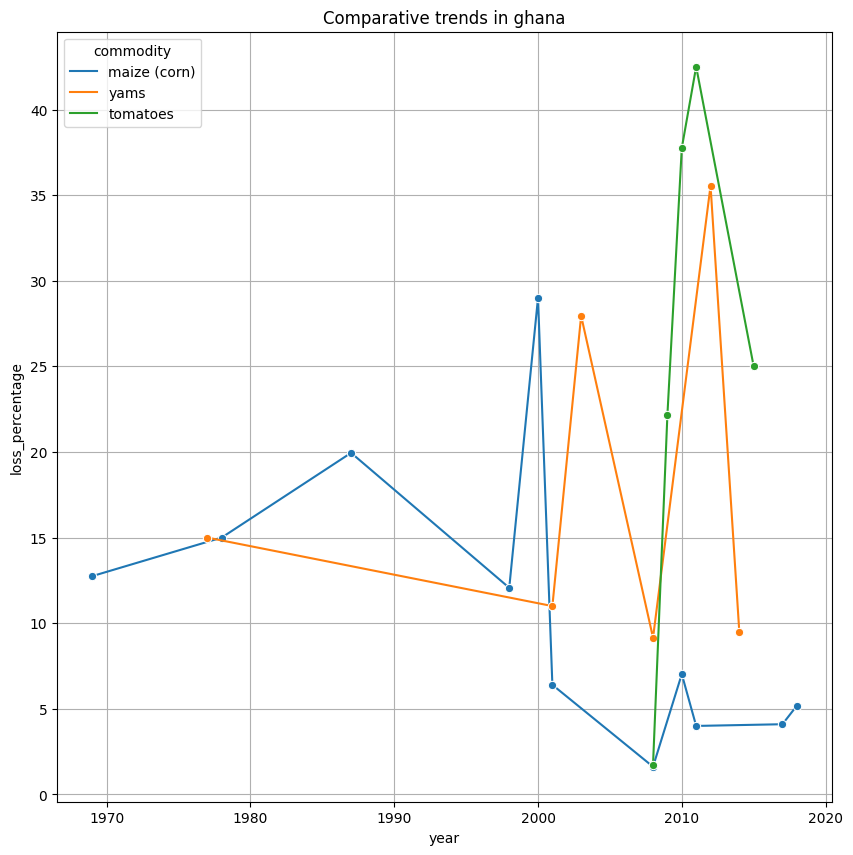

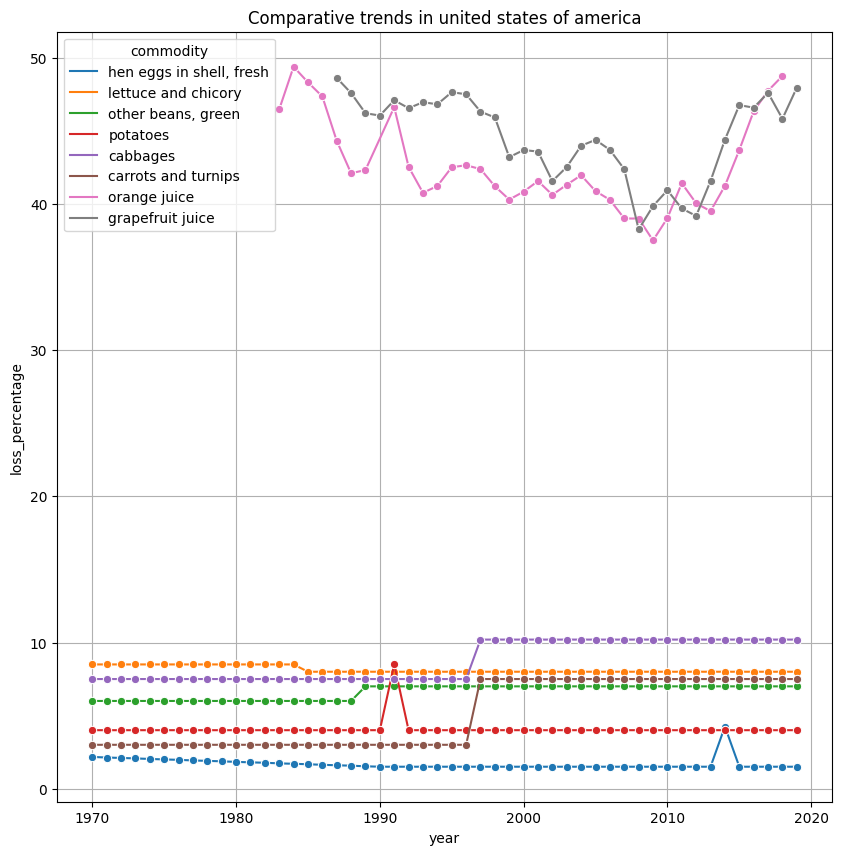

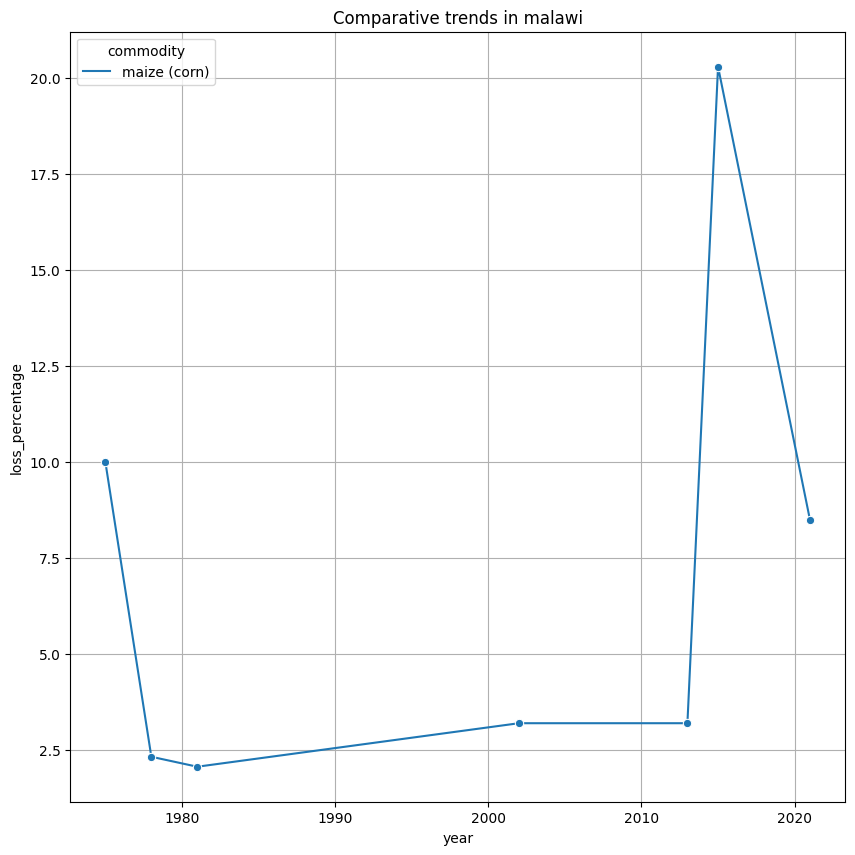

...

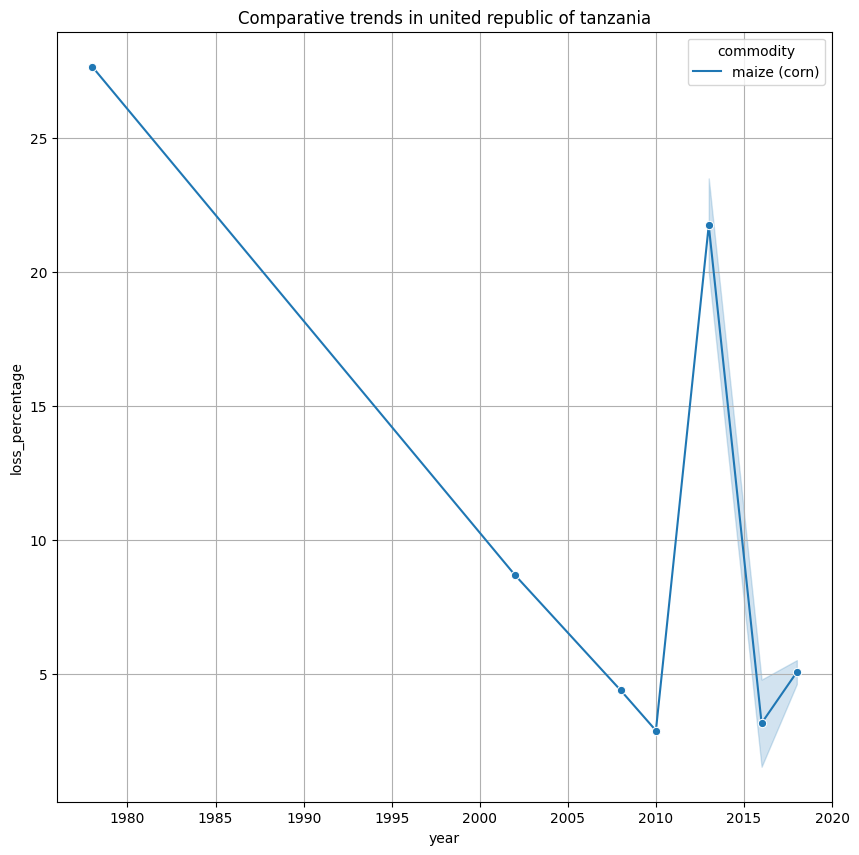

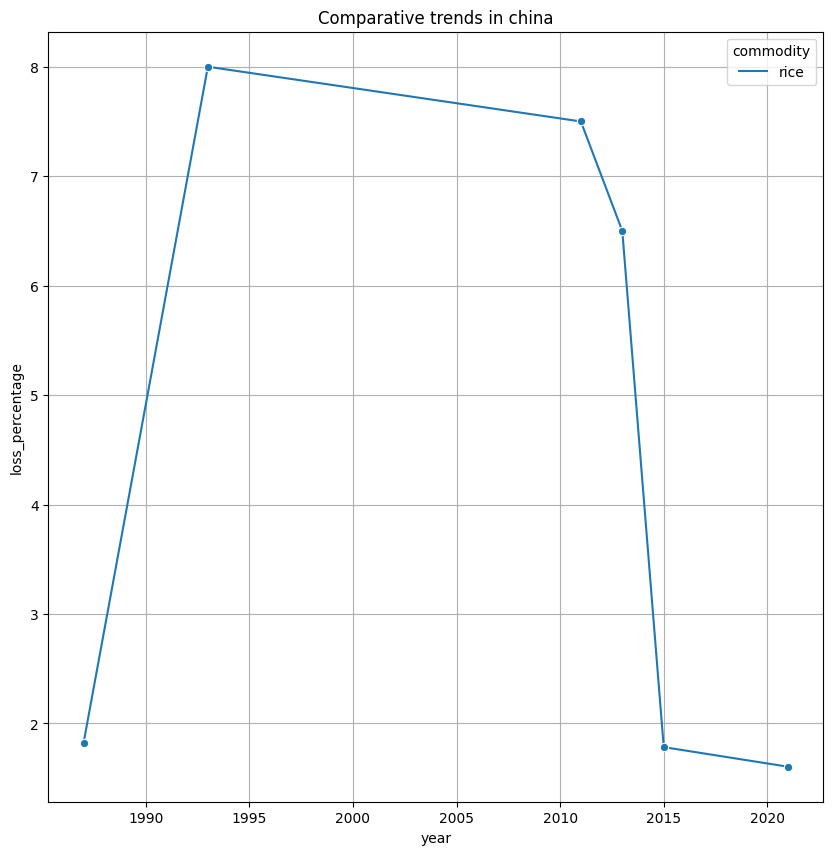

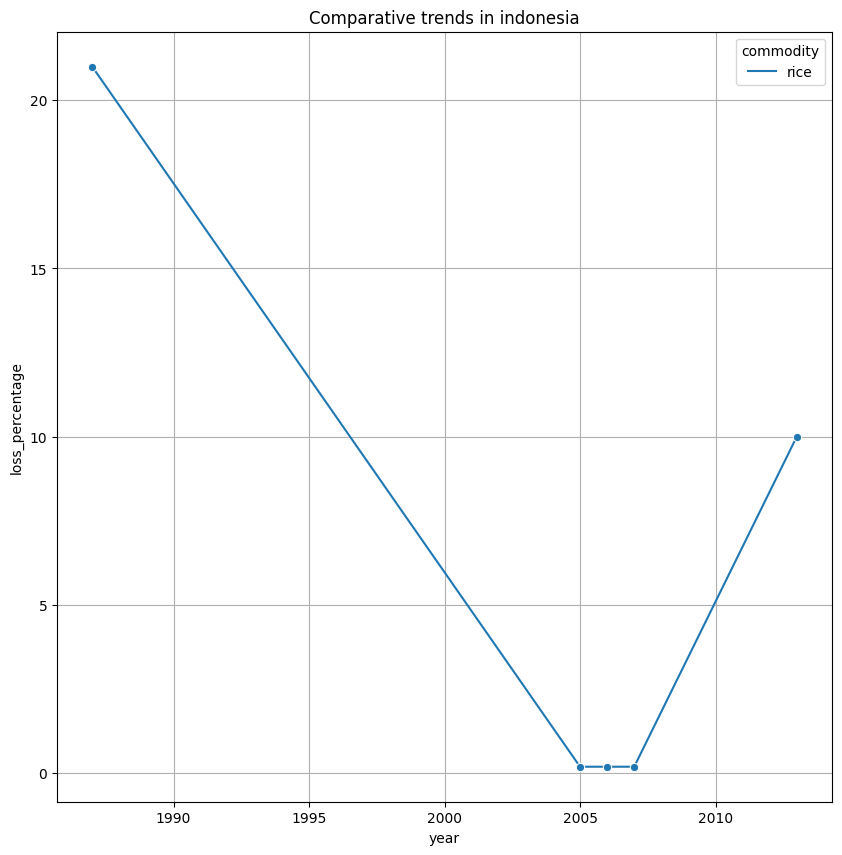

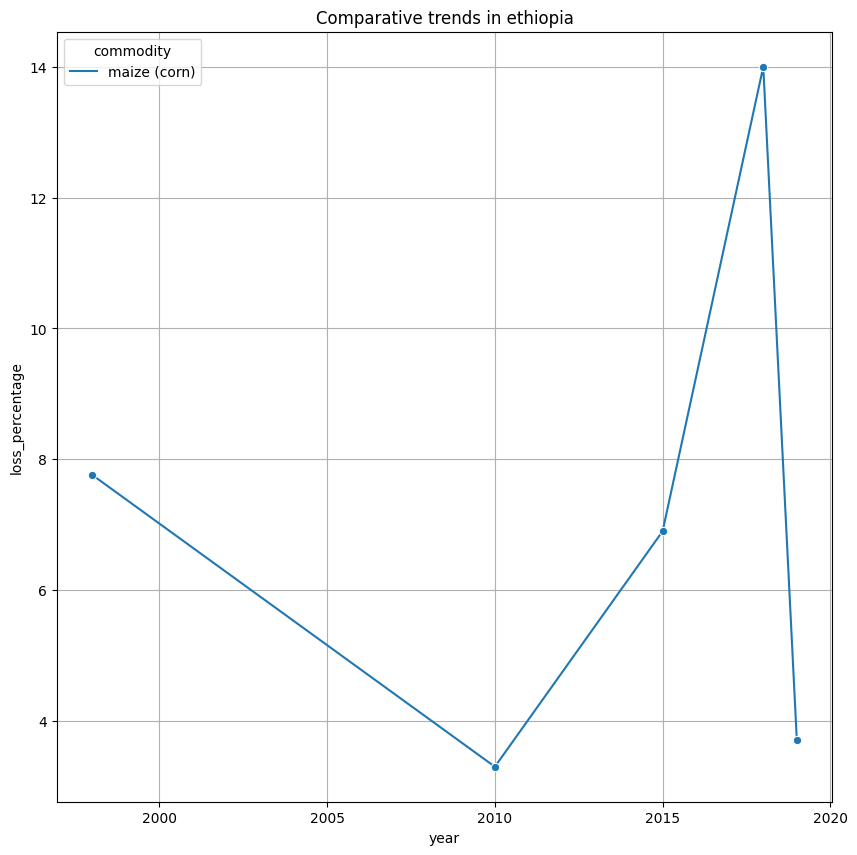

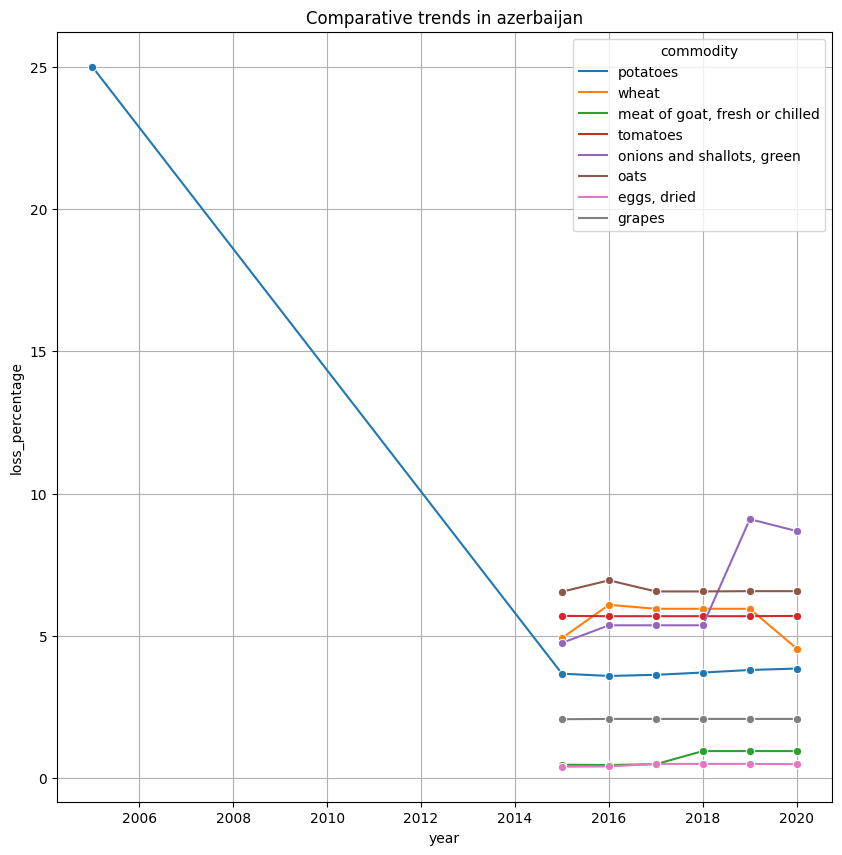

In [25]:
for country in final_reliable_data.country.unique():
    country_data = final_reliable_data[final_reliable_data.country == country]
    plt.figure(figsize = (10,10))
    plt.title('Comparative trends in ' + country)
    sns.lineplot(x = country_data.year, y = country_data.loss_percentage,
            marker = "o", hue = country_data.commodity)
    plt.grid()
    plt.show()

In [26]:
final_reliable_data.sort_values(by = ['year'], ascending = True, inplace = True)

In [27]:
# One-hot encoding country, commodity, and food supply stage

modeling_data = final_reliable_data.copy()

for col in ['country', 'commodity', 'food_supply_stage']:
    modeling_data = modeling_data.join(pd.get_dummies(modeling_data[col])).drop(columns = [col])

In [28]:
# Creating lag features (previous nth value)

modeling_data['loss_lag_1'] = modeling_data.groupby('main_key').loss_percentage.shift(1)
modeling_data['loss_lag_2'] = modeling_data.groupby('main_key').loss_percentage.shift(2)
modeling_data['loss_lag_3'] = modeling_data.groupby('main_key').loss_percentage.shift(3)
modeling_data['loss_lag_4'] = modeling_data.groupby('main_key').loss_percentage.shift(4)
modeling_data['loss_lag_5'] = modeling_data.groupby('main_key').loss_percentage.shift(5)

In [29]:
def weighted_average(x):
    return np.average(x, weights=np.arange(1, len(x) + 1))

In [30]:
# Creating weighted moving average features

for i in tqdm(range(2,6)):
    col_name = 'weighted_rolling_average_loss_'+str(i)
    rolling_averages = []
    keys = []
    years = []
    for key in tqdm(modeling_data.main_key.unique()):
        key_data = modeling_data[modeling_data.main_key == key].reset_index(drop = True)
        rolling_weighted_average = list(key_data.loss_percentage.rolling(i, min_periods = 1).apply(weighted_average, raw = False))
        rolling_averages.append(rolling_weighted_average)
        keys.append([key]*len(rolling_weighted_average))
        years.append(list(key_data.year))

    rolling_averages = sum(rolling_averages,[])
    keys = sum(keys,[])
    years = sum(years,[])

    avg_data = pd.DataFrame({'main_key':keys, 'year':years, col_name:rolling_averages})
    modeling_data = modeling_data.merge(avg_data, on = ['main_key', 'year'], how = 'left')
    modeling_data[col_name] = modeling_data.groupby('main_key')[col_name].shift(1)


100%|██████████| 4/4 [00:00<00:00, 22.82it/s]


In [ ]:
modeling_data.shape

#### XGBoost model

Training data - before 2012
Validation data - 2012-2016
Test data - 2017 onwards

In [31]:
trainable_data = modeling_data.drop(columns = ['loss_percentage','cause_of_loss'])
target = modeling_data[['main_key', 'year', 'loss_percentage']]

# trainable_data.fillna(-999,inplace = True)

xtrain, ytrain = trainable_data[trainable_data.year < 2012].reset_index(drop = True), target[target.year < 2012].loss_percentage
xval, yval = trainable_data[(trainable_data.year >= 2012) &
                           (trainable_data.year < 2017)].reset_index(drop = True), target[(target.year >= 2012) &
                                                                                         (target.year < 2017)].loss_percentage
xtest, ytest = trainable_data[trainable_data.year >= 2017].reset_index(drop = True), target[target.year >= 2017].loss_percentage

In [32]:
print(xtrain.shape, xval.shape, xtest.shape)
print(len(ytrain), len(yval), len(ytest))

(425, 49) (109, 49) (64, 49)
425 109 64


In [33]:
params = {"objective":"reg:linear",
          "booster":"gbtree",
          "eta":0.01,
          "max_depth": 8,
         "subsample":0.95,
         "silent":1,
         "seed":1,
         "lambda":0.01,
         "alpha":0.01,
         "eval_metric":"rmse"}

In [34]:
num_boost_round = 1000

dtrain = xgb.DMatrix(xtrain.drop(columns = ['main_key']), ytrain)
dvalid = xgb.DMatrix(xval.drop(columns = ['main_key']), yval)

watchlist = [(dtrain, 'train'), (dvalid, 'eval')]

booster = xgb.train(params, dtrain, num_boost_round, evals = watchlist, early_stopping_rounds = 25)

[0]	train-rmse:13.11903	eval-rmse:12.12354
[1]	train-rmse:12.99786	eval-rmse:12.05338
[2]	train-rmse:12.87769	eval-rmse:11.98615
[3]	train-rmse:12.75933	eval-rmse:11.91644
[4]	train-rmse:12.64261	eval-rmse:11.84877
[5]	train-rmse:12.52661	eval-rmse:11.78817
[6]	train-rmse:12.40984	eval-rmse:11.70933
[7]	train-rmse:12.29571	eval-rmse:11.64643
[8]	train-rmse:12.18334	eval-rmse:11.58773
[9]	train-rmse:12.07277	eval-rmse:11.53181
[10]	train-rmse:11.96303	eval-rmse:11.46414
[11]	train-rmse:11.85204	eval-rmse:11.39130
[12]	train-rmse:11.73877	eval-rmse:11.30646
[13]	train-rmse:11.63206	eval-rmse:11.25195
[14]	train-rmse:11.52076	eval-rmse:11.17617
[15]	train-rmse:11.41423	eval-rmse:11.10750
[16]	train-rmse:11.30856	eval-rmse:11.04084
[17]	train-rmse:11.20648	eval-rmse:10.99027
[18]	train-rmse:11.10587	eval-rmse:10.92745
[19]	train-rmse:11.00463	eval-rmse:10.85409
[20]	train-rmse:10.90584	eval-rmse:10.80393
[21]	train-rmse:10.80342	eval-rmse:10.73353
[22]	train-rmse:10.70455	eval-rmse:10.6879

In [35]:
train_predictions = booster.predict(xgb.DMatrix(xtrain.drop(columns = ['main_key'])))
val_predictions = booster.predict(xgb.DMatrix(xval.drop(columns = ['main_key'])))
test_predictions = booster.predict(xgb.DMatrix(xtest.drop(columns = ['main_key'])))

In [36]:
print(f'Training RMSE = {np.round(np.sqrt(mean_squared_error(train_predictions, ytrain)),2)} | MAPE = {np.round(100*mean_absolute_percentage_error(train_predictions, ytrain),2)}% | R-squared = {np.round(r2_score(train_predictions, ytrain),2)}')
print(f'Validation RMSE = {np.round(np.sqrt(mean_squared_error(val_predictions, yval)),2)} | MAPE = {np.round(100*mean_absolute_percentage_error(val_predictions, yval),2)}% | R-squared = {np.round(r2_score(val_predictions, yval),2)}')
print(f'Test RMSE = {np.round(np.sqrt(mean_squared_error(test_predictions, ytest)),2)} | MAPE = {np.round(100*mean_absolute_percentage_error(test_predictions, ytest),2)}% | R-squared = {np.round(r2_score(test_predictions, ytest),2)}')

Training RMSE = 1.95 | MAPE = 18.59% | R-squared = 0.97
Validation RMSE = 7.54 | MAPE = 52.49% | R-squared = 0.33
Test RMSE = 5.61 | MAPE = 41.01% | R-squared = 0.66


Result analysis

In [37]:
all_predictions = np.concatenate([train_predictions, val_predictions, test_predictions])

In [38]:
len(all_predictions)

598

In [39]:
modeling_data['predictions'] = all_predictions

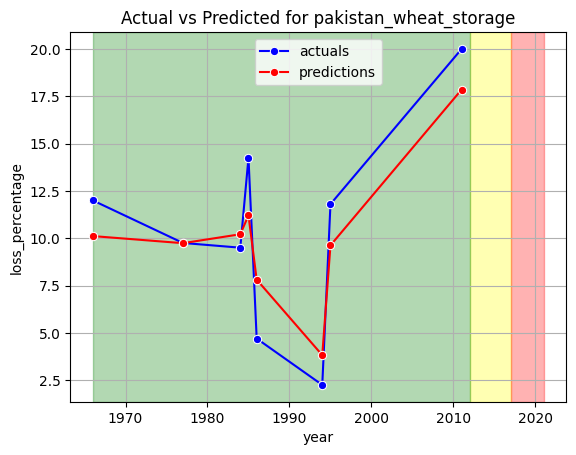

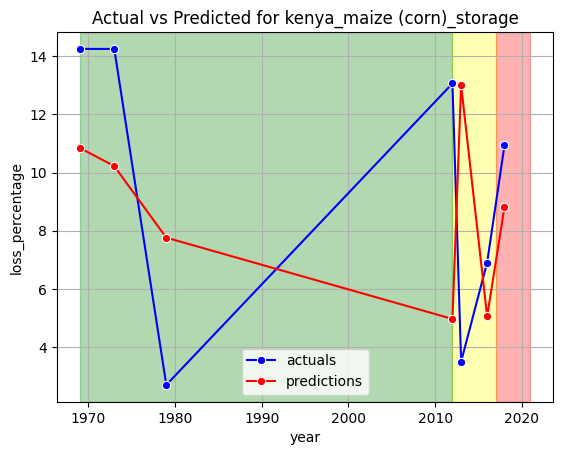

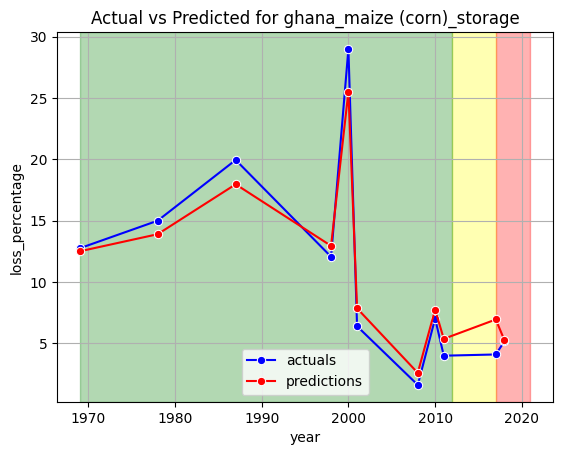

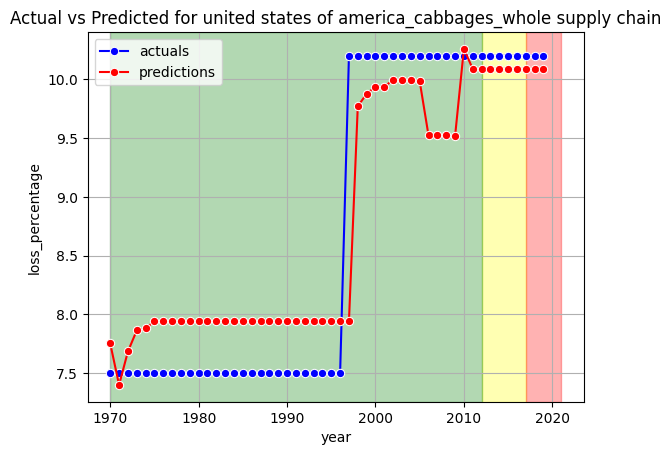

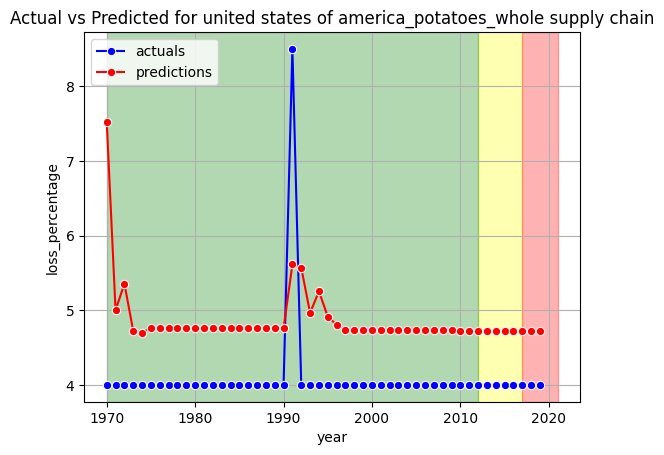

...

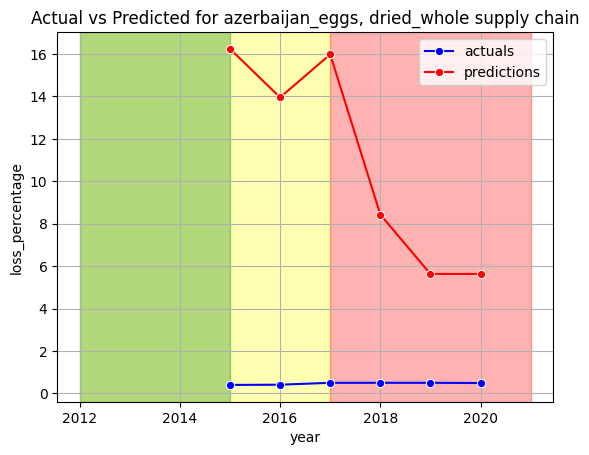

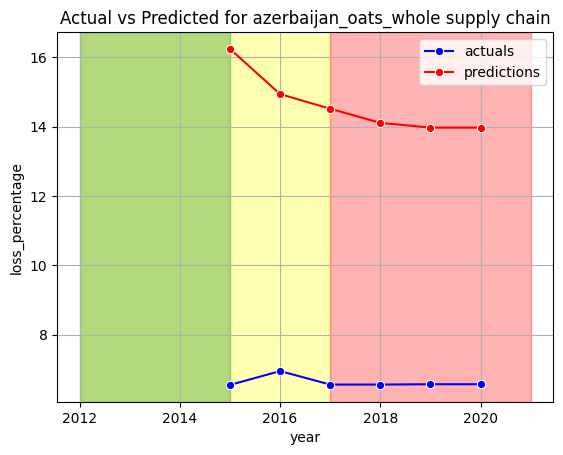

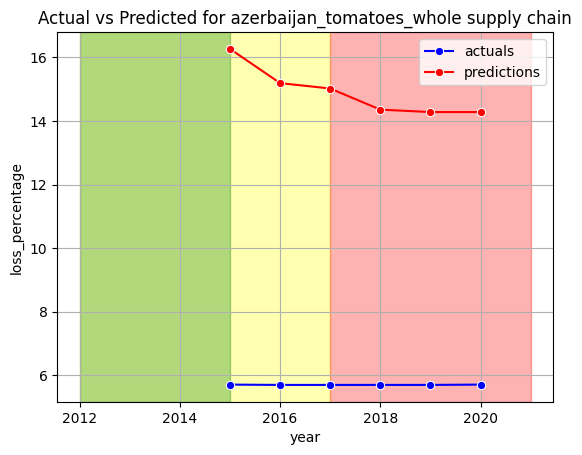

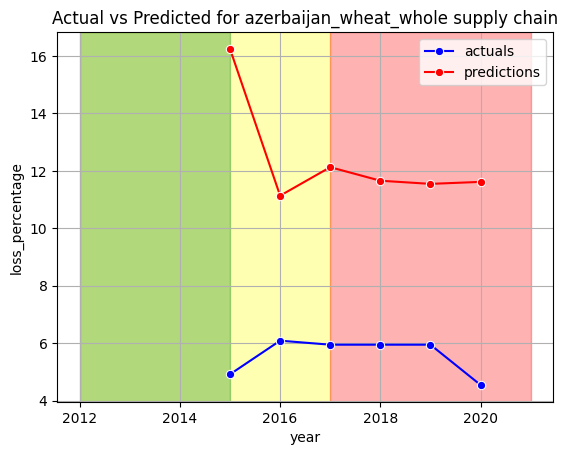

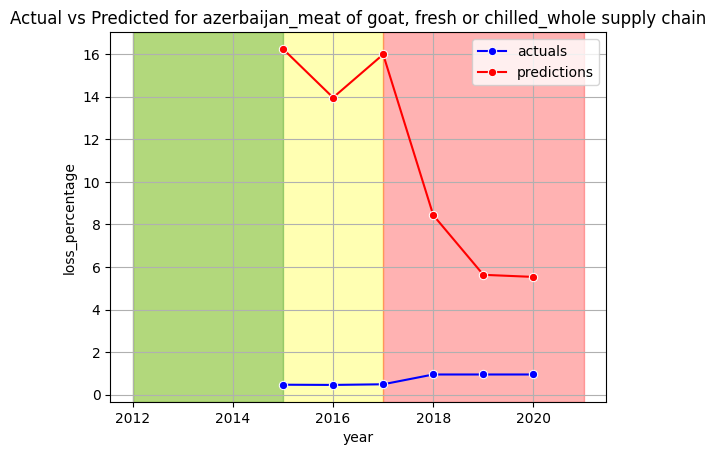

In [40]:
# Plotting actual vs predicted for all keys and all sets

for key in modeling_data.main_key.unique():
  key_data = modeling_data[modeling_data.main_key == key]
  plt.title(f'Actual vs Predicted for {key}')
  ax = sns.lineplot(x = key_data.year, y = key_data.loss_percentage,
               marker = "o", label = 'actuals', color = "blue")
  ax = sns.lineplot(x = key_data.year, y = key_data.predictions,
               marker = "o", label = 'predictions', color = "red")
  ax.axvspan(2012, 2017, alpha=0.3, color = 'yellow', label = 'train')
  ax.axvspan(min(key_data.year),2012, alpha=0.3, color = 'green', label = 'val')
  ax.axvspan(2017, 2021, alpha=0.3, color = 'red', label = 'test')
  plt.grid()
  plt.show()

### State-space models

In [41]:
modeling_data.shape

(598, 52)

In [42]:
modeling_data.main_key.nunique()

44

In [43]:
# Converting all series to a numpy array

time_series_data = dict()

for key in modeling_data.main_key.unique():
    time_series_data[key] = list(modeling_data[modeling_data.main_key == key].loss_percentage)

In [44]:
time_series_data.shape

AttributeError: 'dict' object has no attribute 'shape'

In [47]:
# Defining our structural time series model components
def build_model(observed_time_series):
  trend = tfp.sts.LocalLinearTrend(observed_time_series = observed_time_series)
  arima = tfp.sts.AutoregressiveIntegratedMovingAverage(3,3,
    integration_degree=1,
    observed_time_series=observed_time_series)
  model = tfp.sts.Sum([arima, trend], observed_time_series=observed_time_series)
  return model

  0%|          | 0/44 [00:00<?, ?it/s]

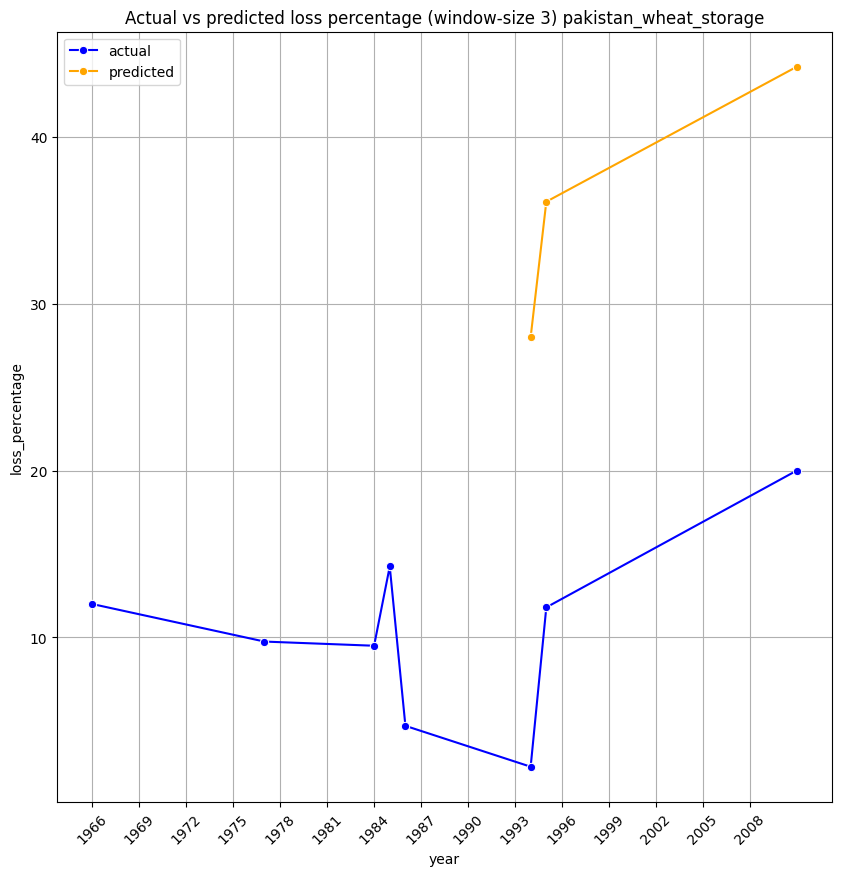

  2%|▏         | 1/44 [00:28<20:07, 28.07s/it]

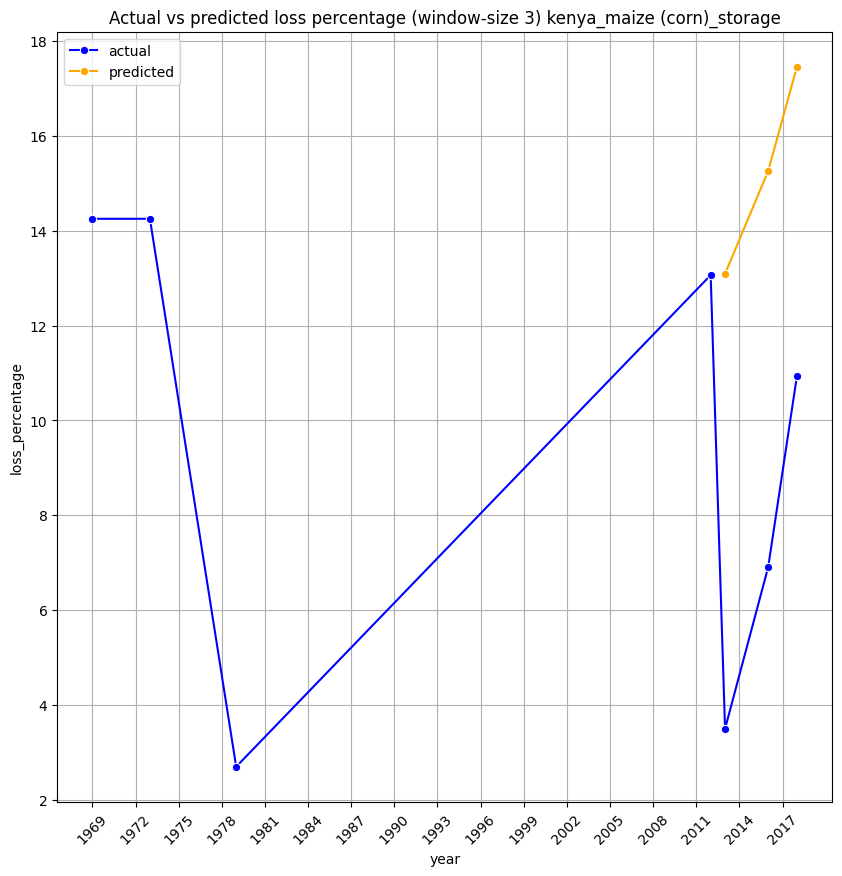

  5%|▍         | 2/44 [00:58<20:39, 29.52s/it]

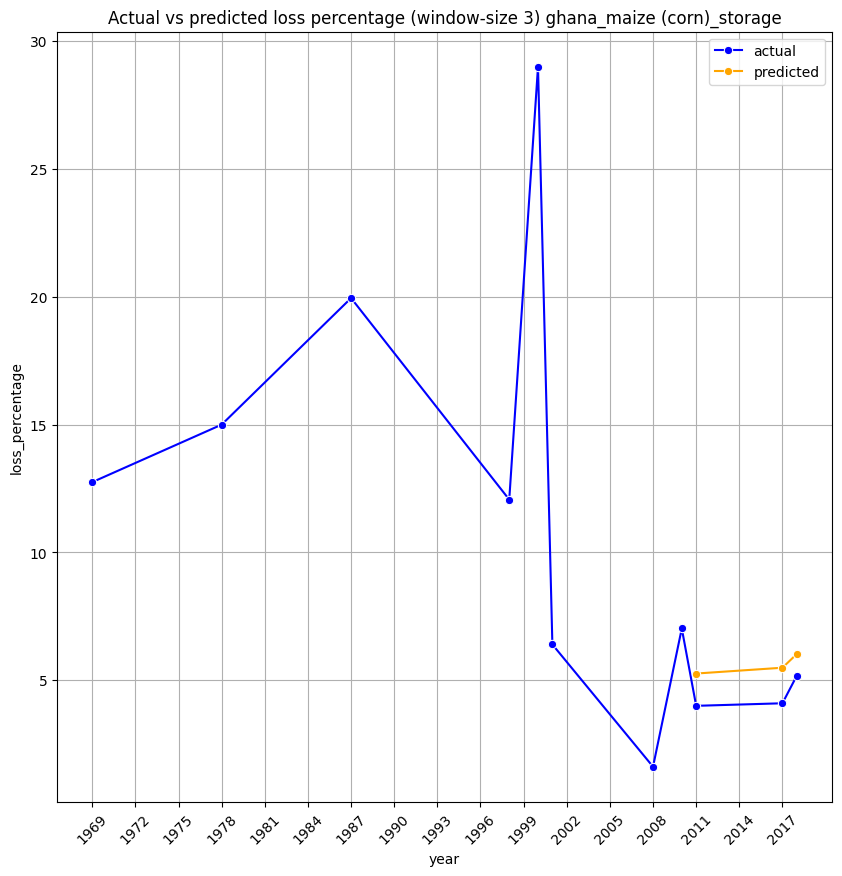

  7%|▋         | 3/44 [01:31<21:10, 30.98s/it]

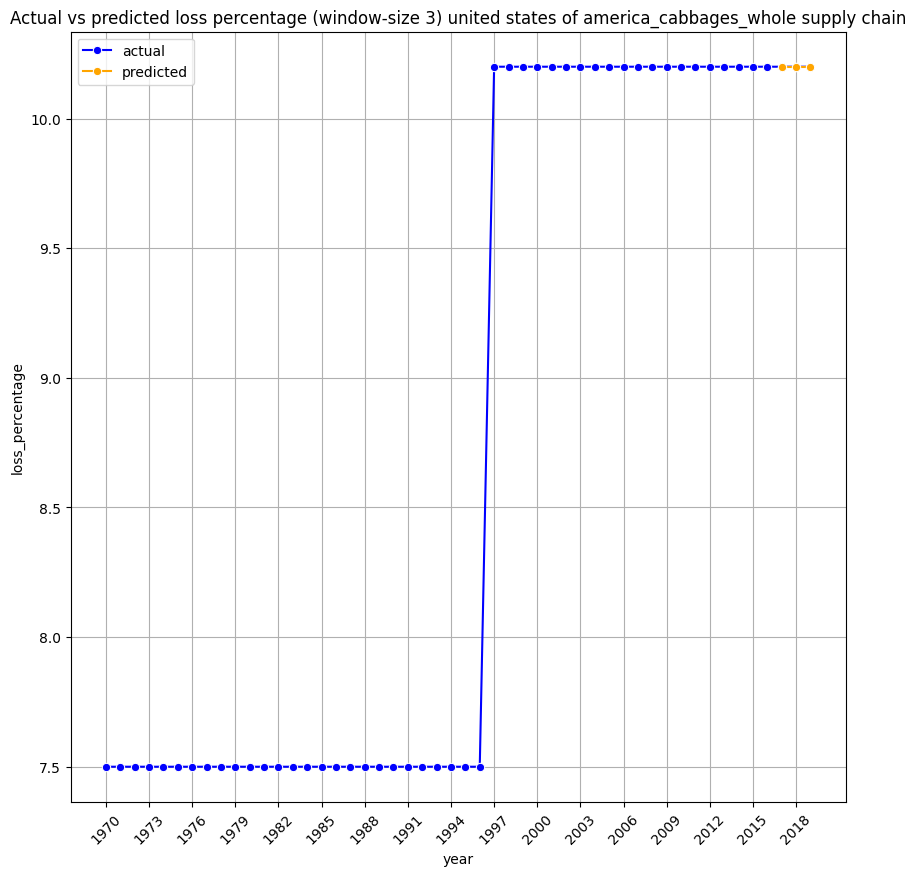

  9%|▉         | 4/44 [02:02<20:37, 30.94s/it]

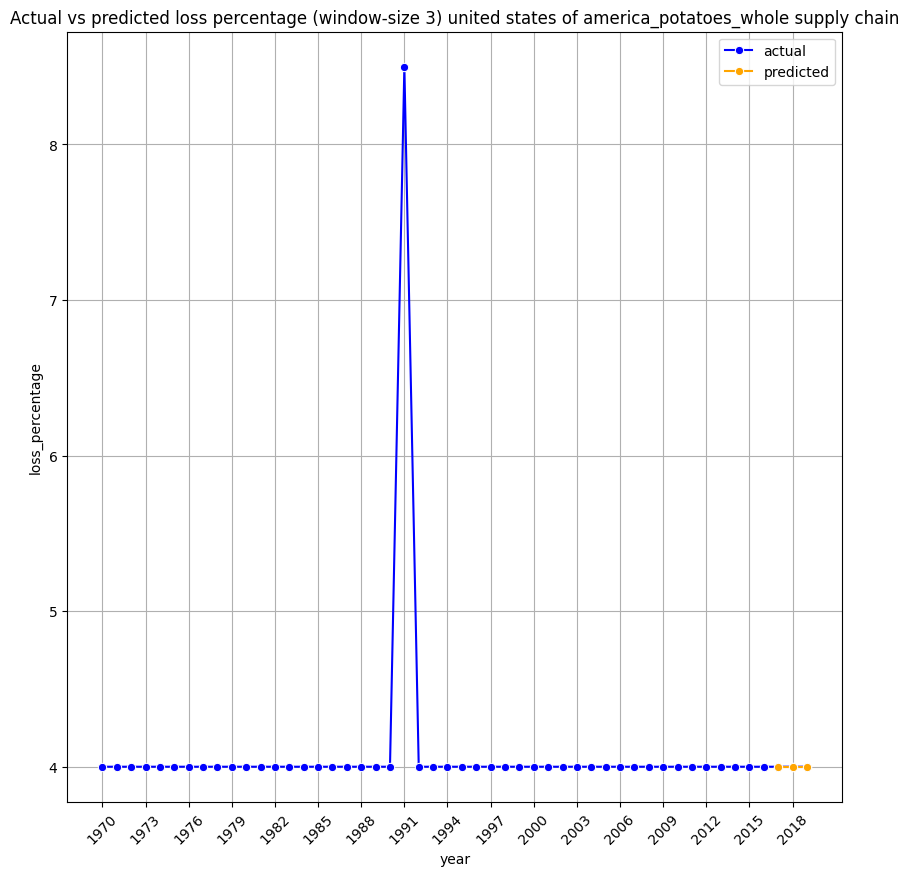

 11%|█▏        | 5/44 [02:33<20:07, 30.95s/it]

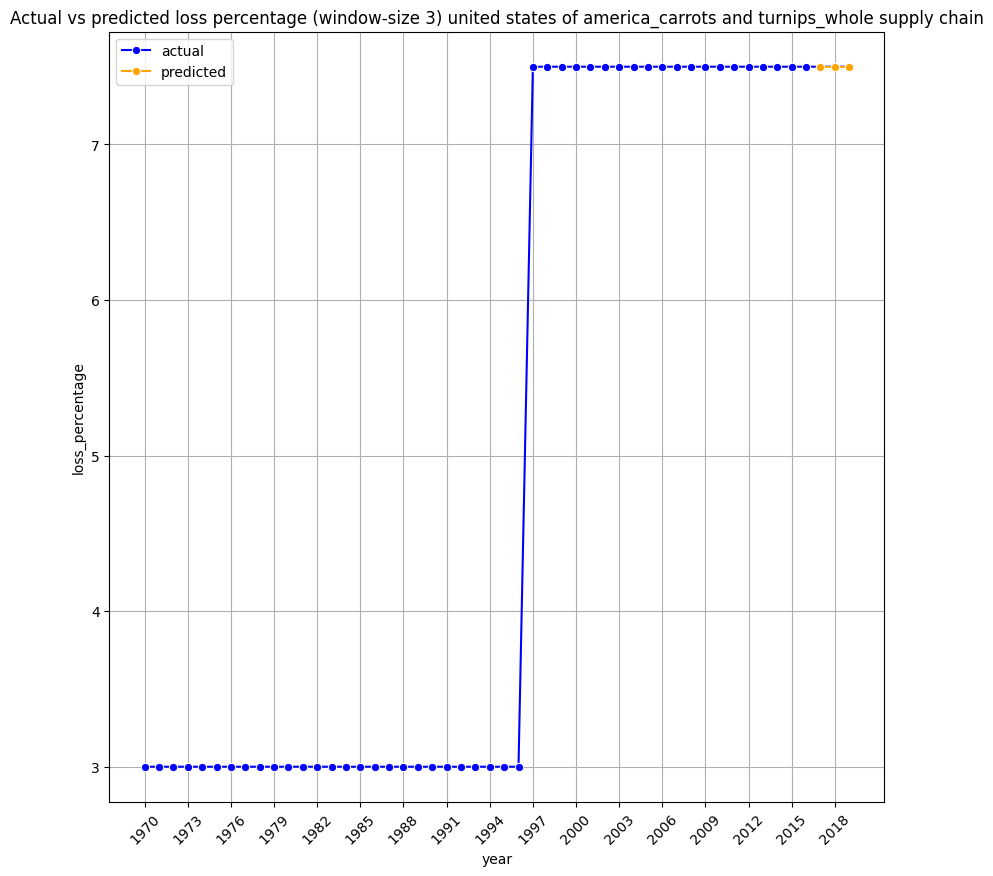

 14%|█▎        | 6/44 [03:06<20:08, 31.81s/it]

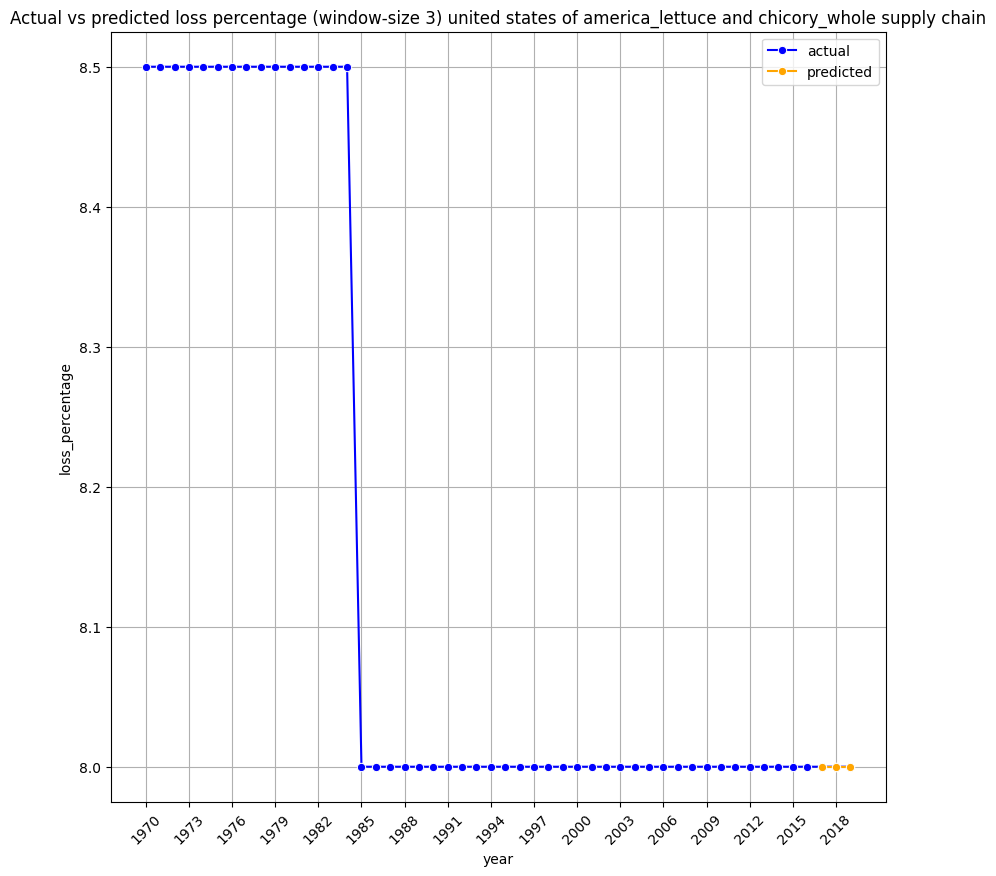

 16%|█▌        | 7/44 [03:42<20:20, 32.98s/it]

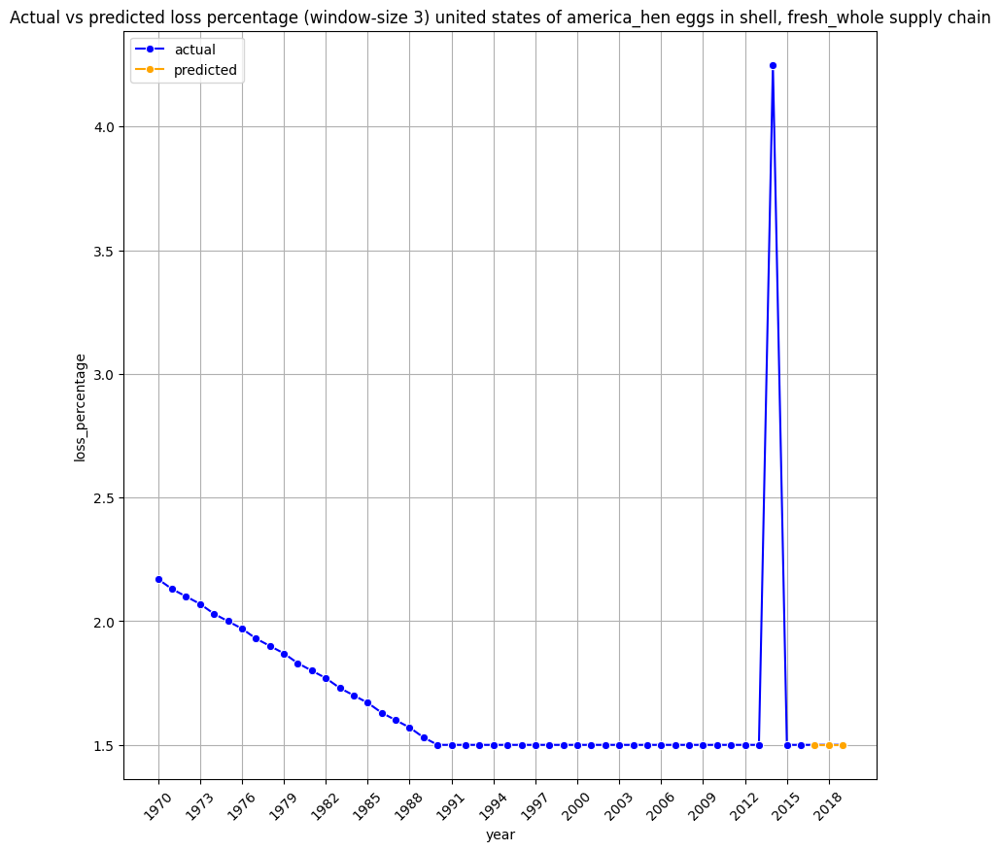

 18%|█▊        | 8/44 [04:16<20:08, 33.58s/it]

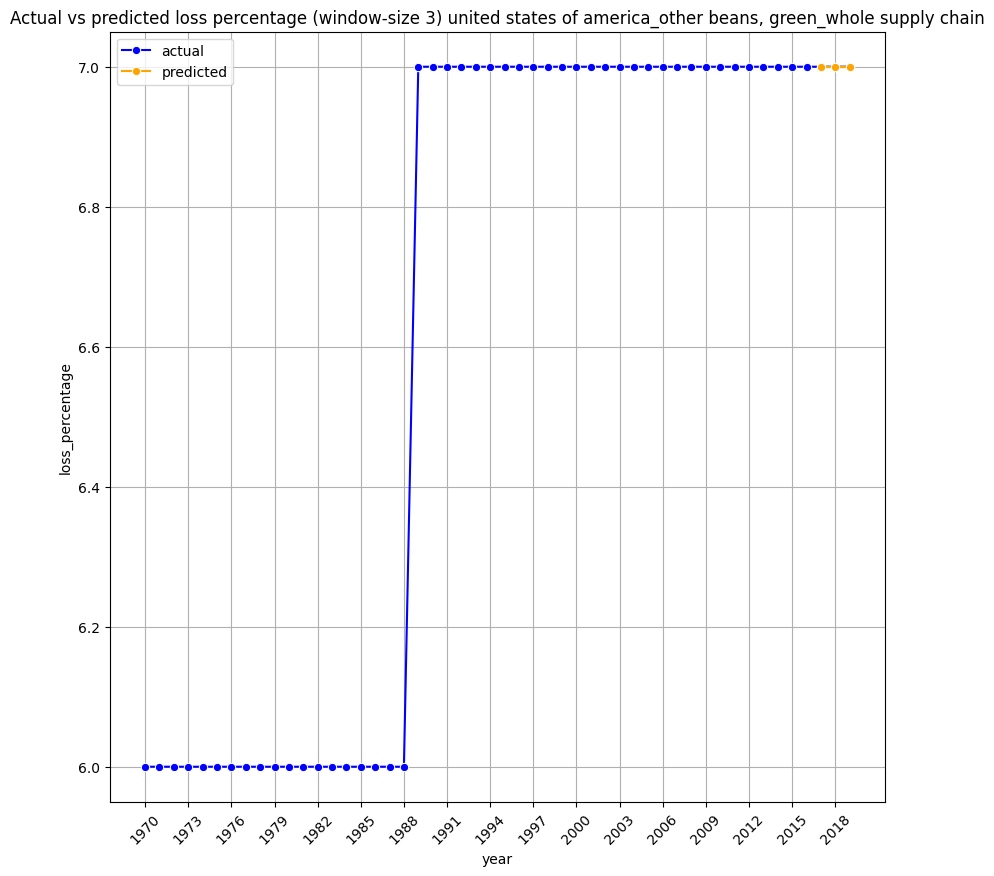

 20%|██        | 9/44 [04:53<20:08, 34.52s/it]

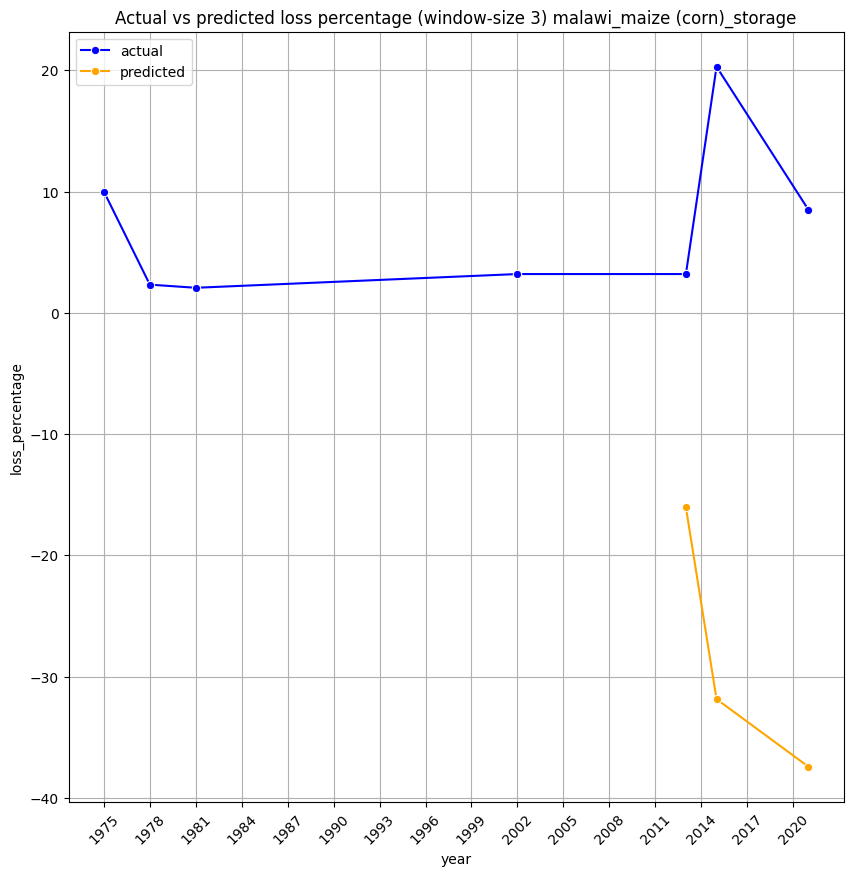

 23%|██▎       | 10/44 [05:28<19:35, 34.59s/it]

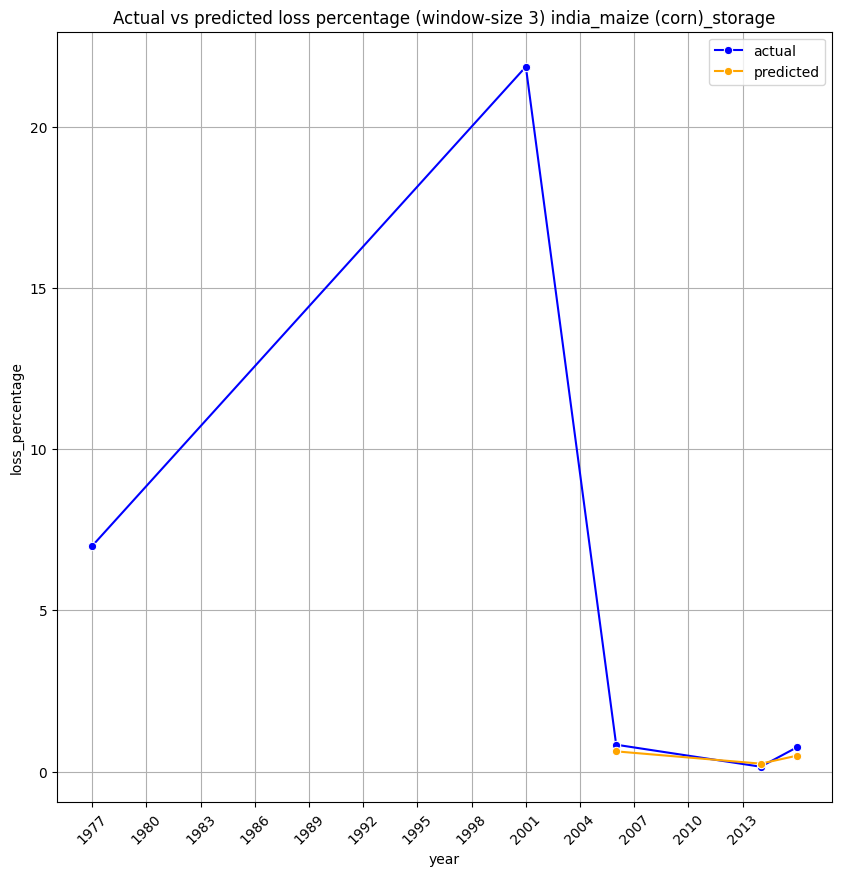

 25%|██▌       | 11/44 [06:02<19:02, 34.63s/it]

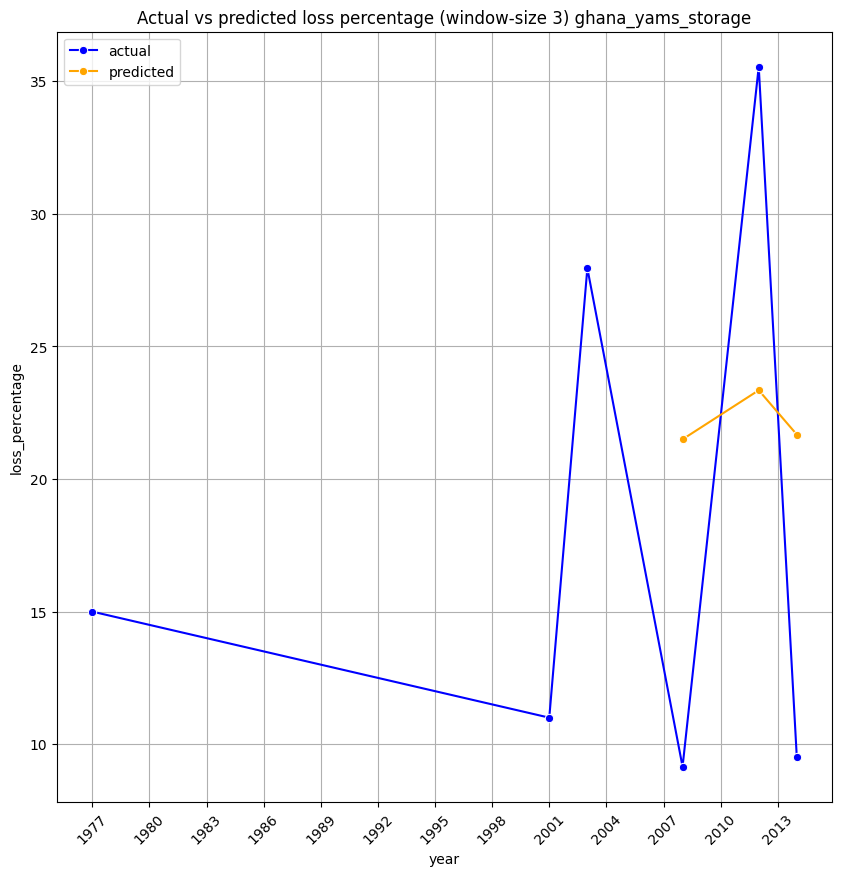

 27%|██▋       | 12/44 [06:34<17:55, 33.61s/it]

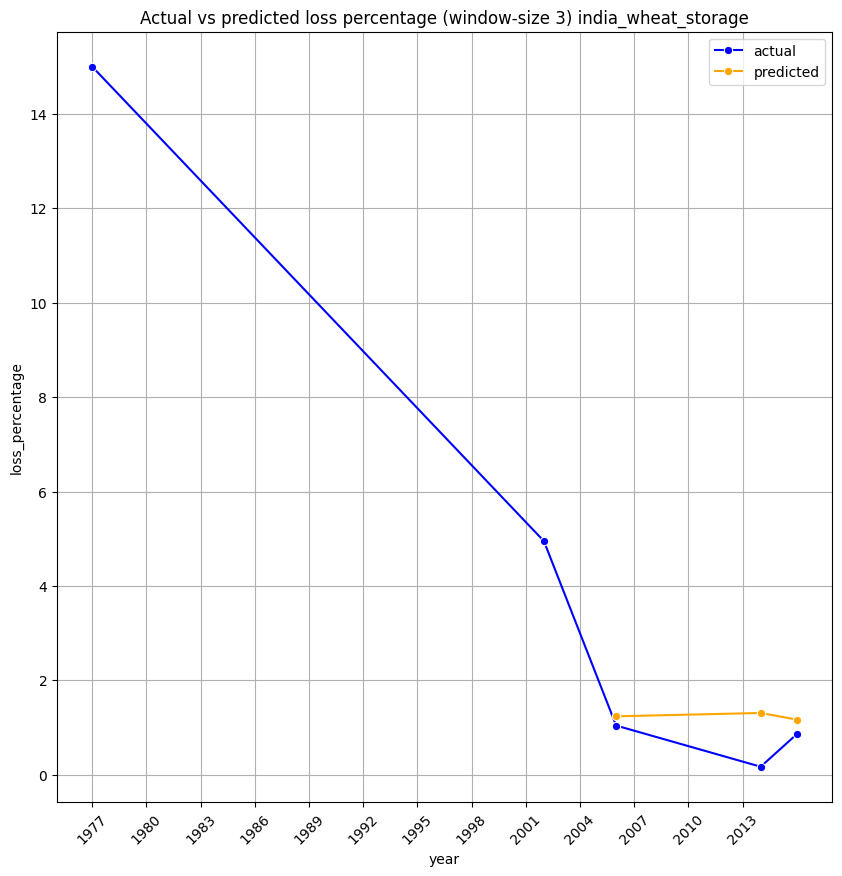

 30%|██▉       | 13/44 [07:06<17:06, 33.10s/it]

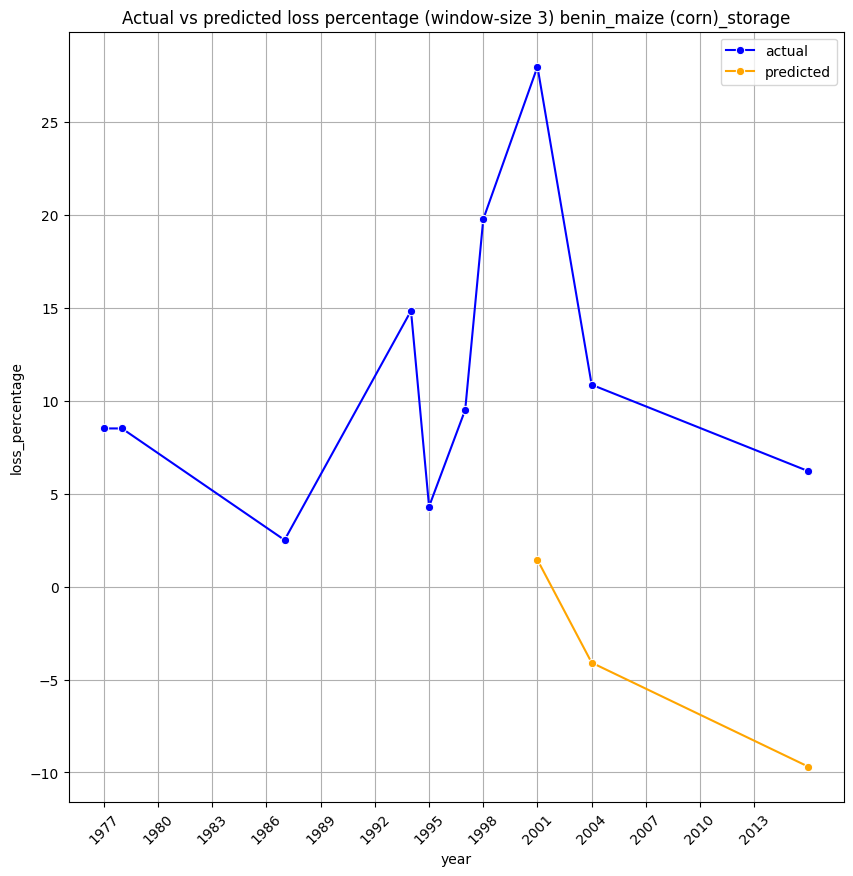

 32%|███▏      | 14/44 [07:37<16:19, 32.66s/it]

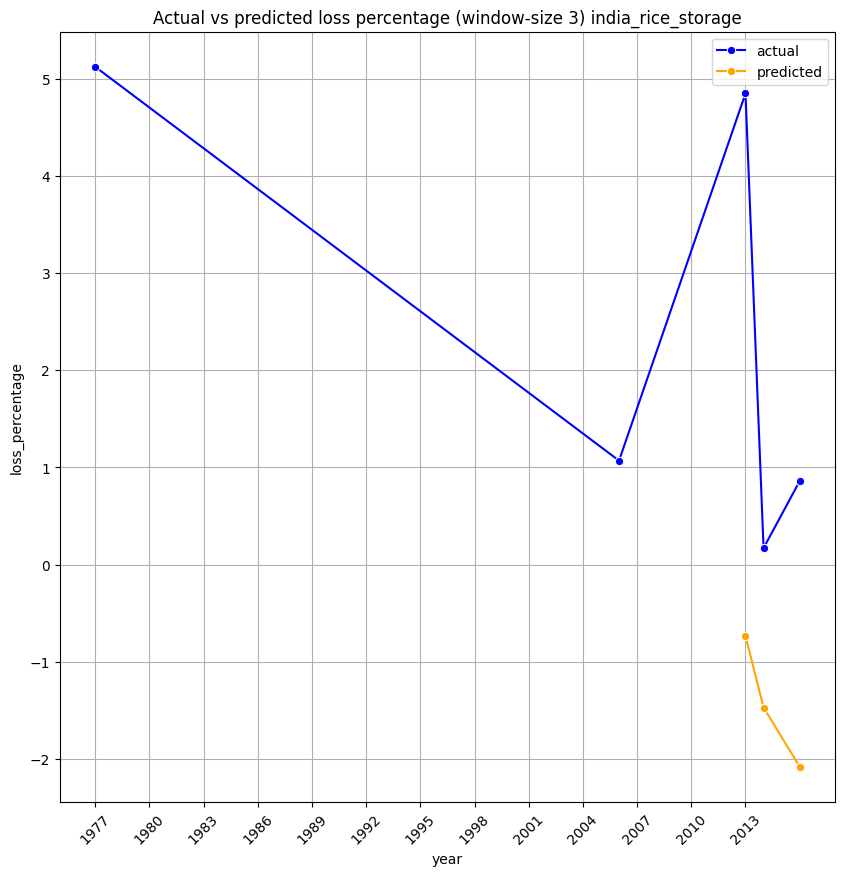

 34%|███▍      | 15/44 [08:09<15:39, 32.40s/it]

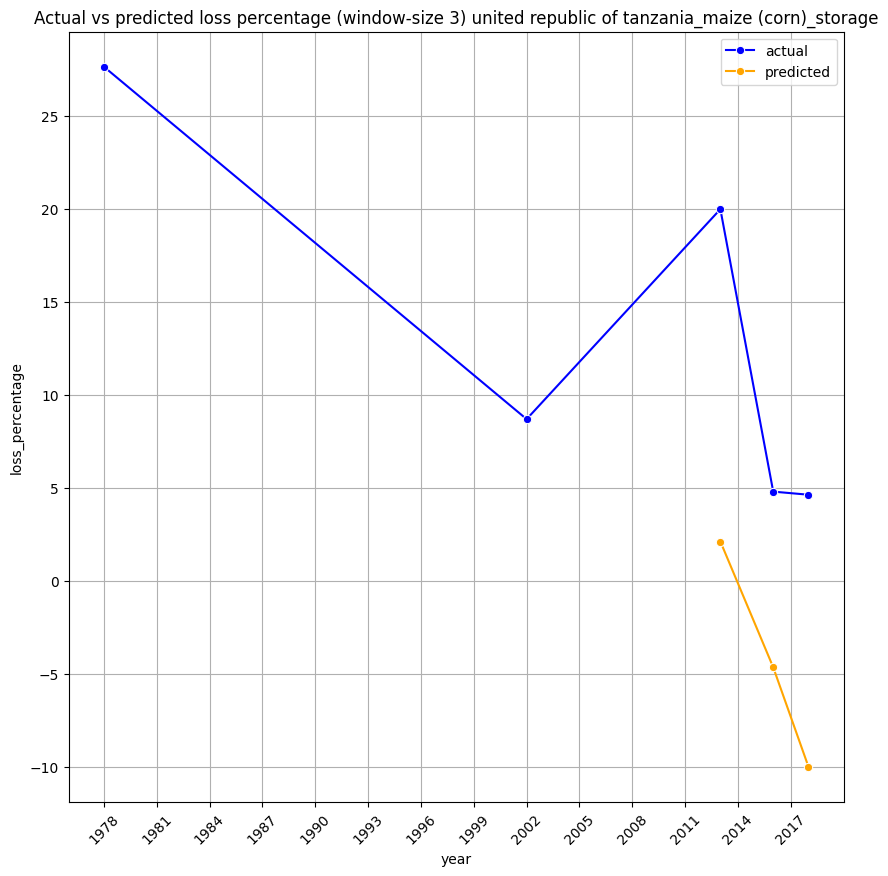

 36%|███▋      | 16/44 [08:41<14:58, 32.11s/it]

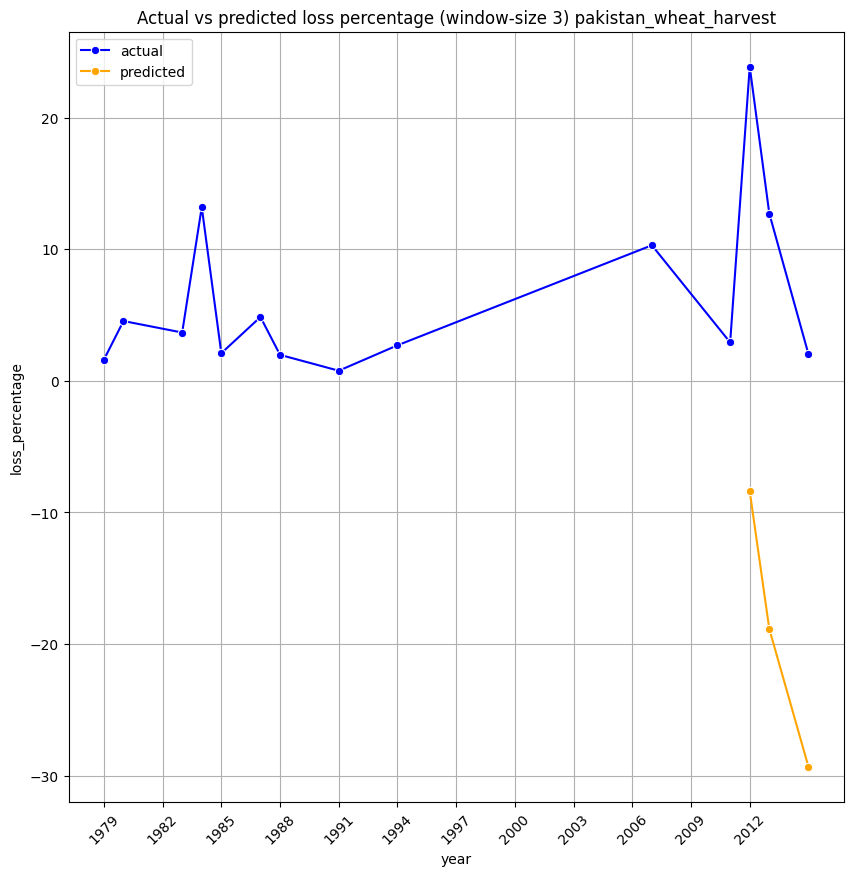

 39%|███▊      | 17/44 [09:11<14:15, 31.70s/it]

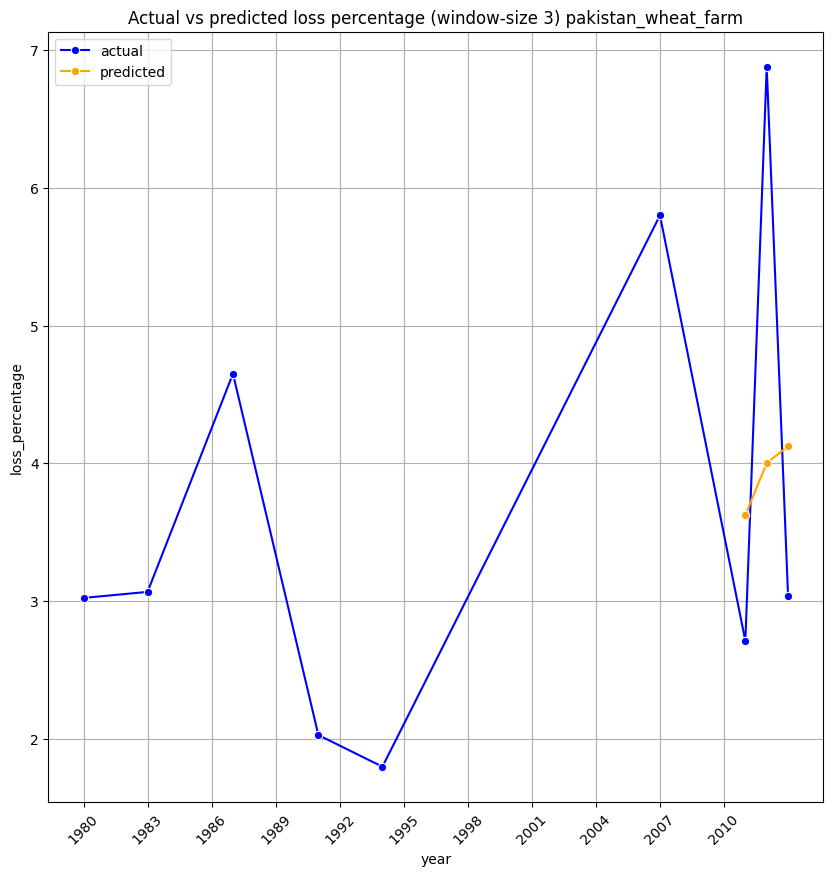

 41%|████      | 18/44 [09:42<13:33, 31.31s/it]

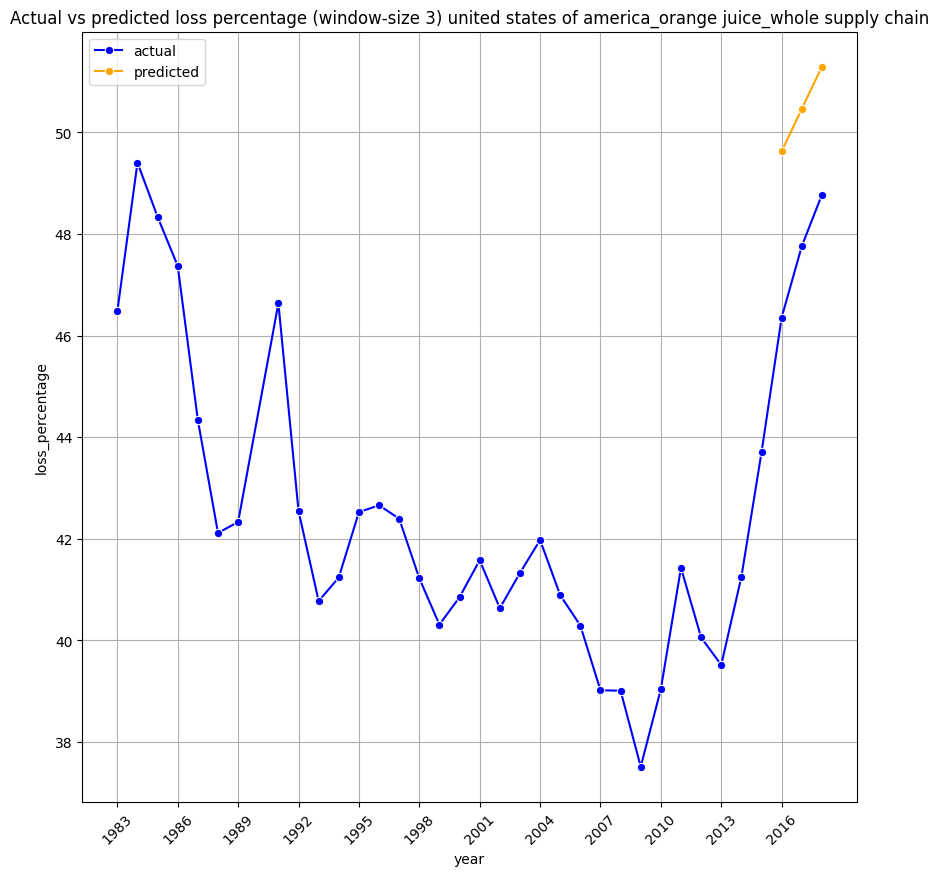

 43%|████▎     | 19/44 [10:12<12:51, 30.87s/it]

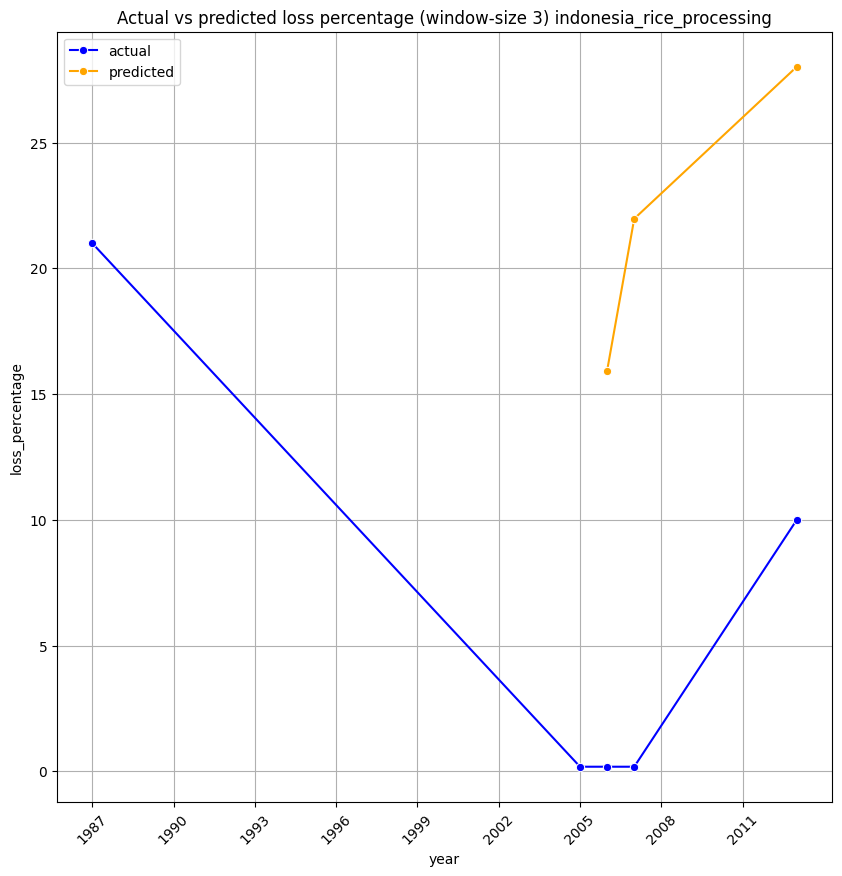

 45%|████▌     | 20/44 [10:41<12:08, 30.35s/it]

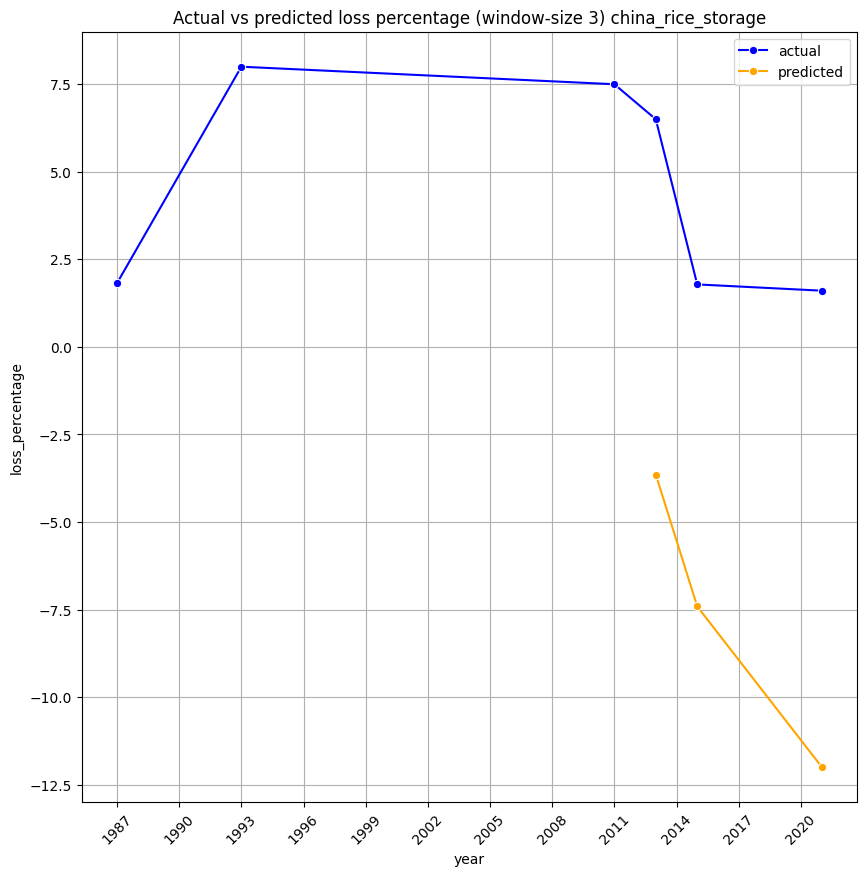

 48%|████▊     | 21/44 [11:06<11:00, 28.71s/it]

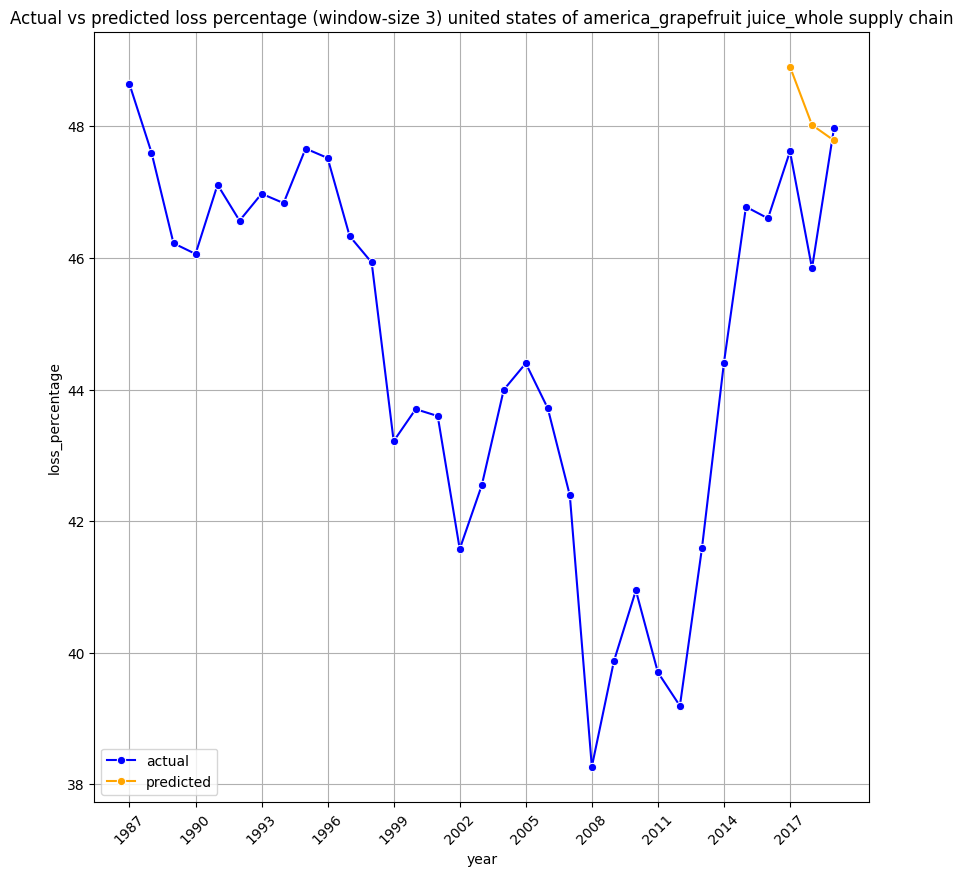

 50%|█████     | 22/44 [11:33<10:20, 28.21s/it]

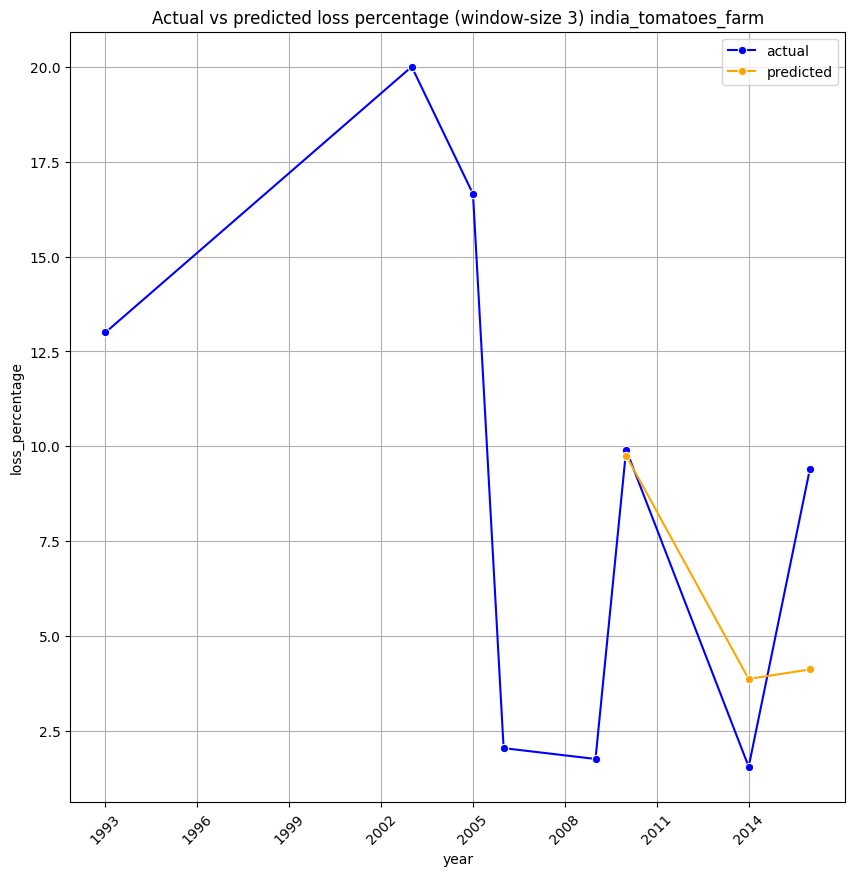

 52%|█████▏    | 23/44 [12:01<09:51, 28.15s/it]

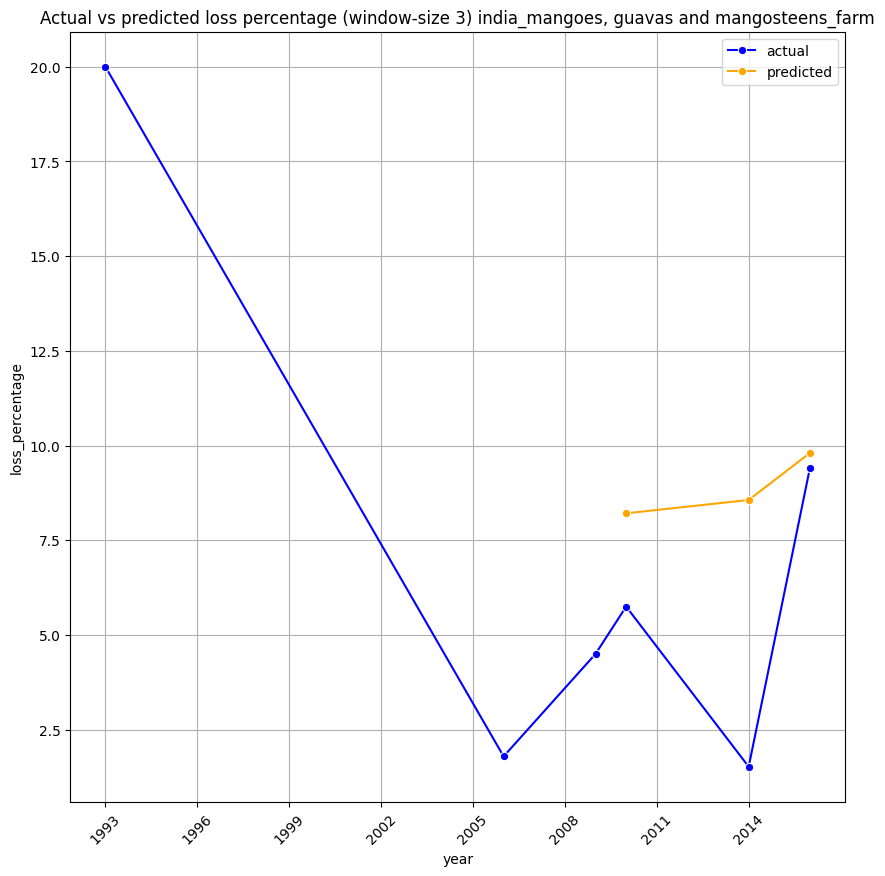

 55%|█████▍    | 24/44 [12:30<09:28, 28.41s/it]

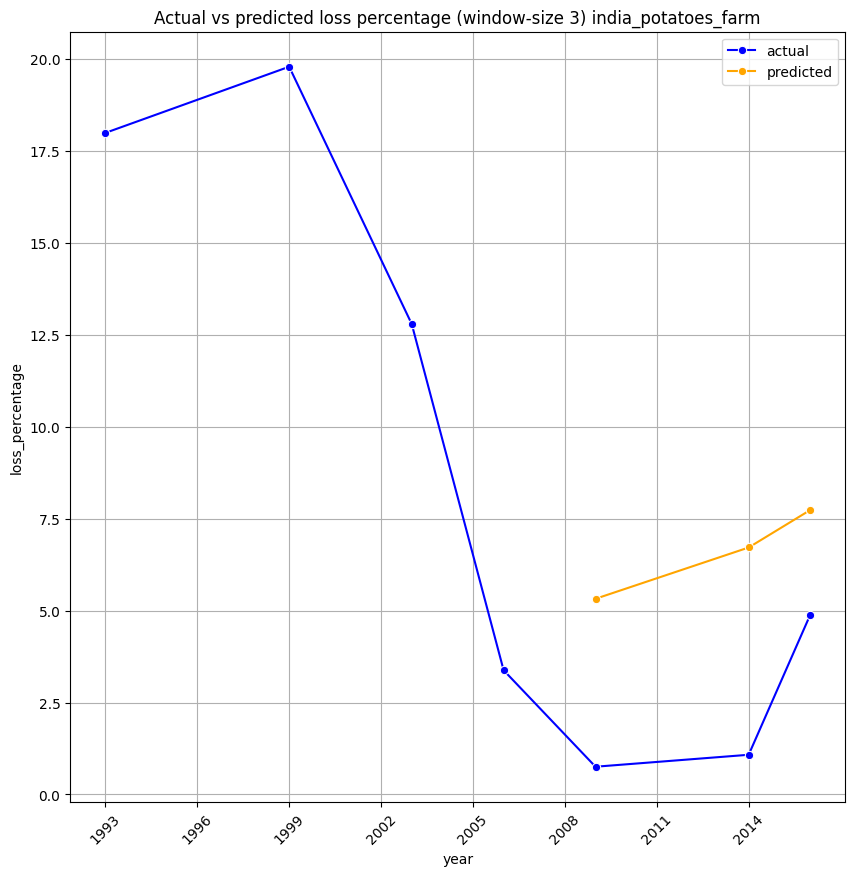

 57%|█████▋    | 25/44 [12:57<08:51, 27.97s/it]

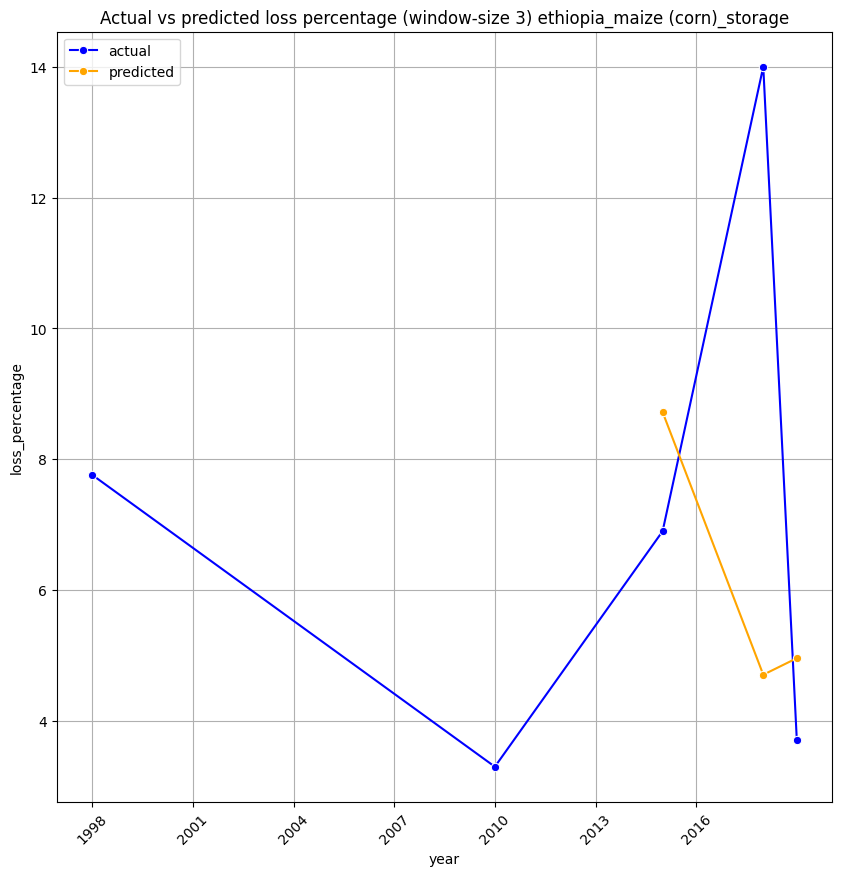

 59%|█████▉    | 26/44 [13:27<08:36, 28.70s/it]

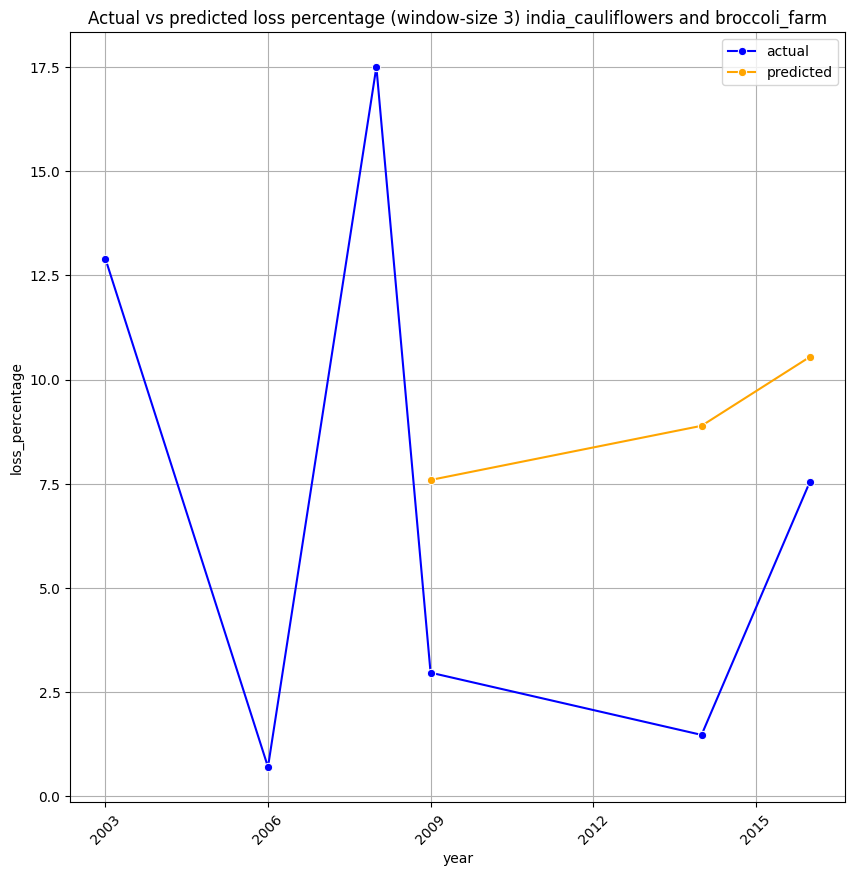

 61%|██████▏   | 27/44 [13:57<08:14, 29.11s/it]

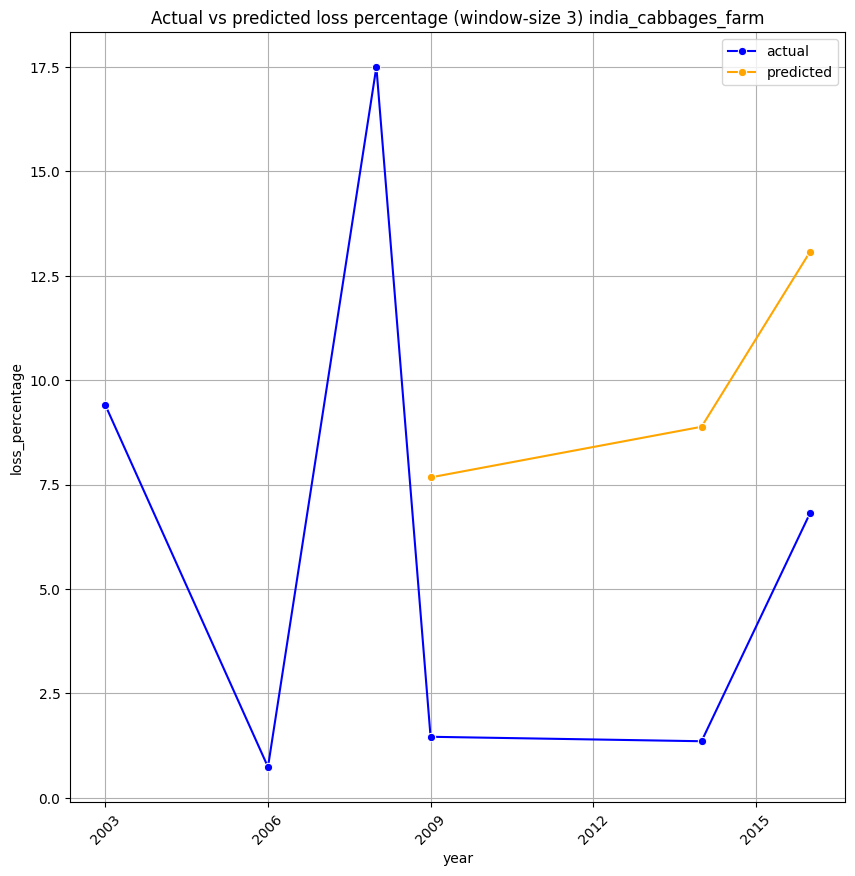

 64%|██████▎   | 28/44 [14:23<07:30, 28.16s/it]

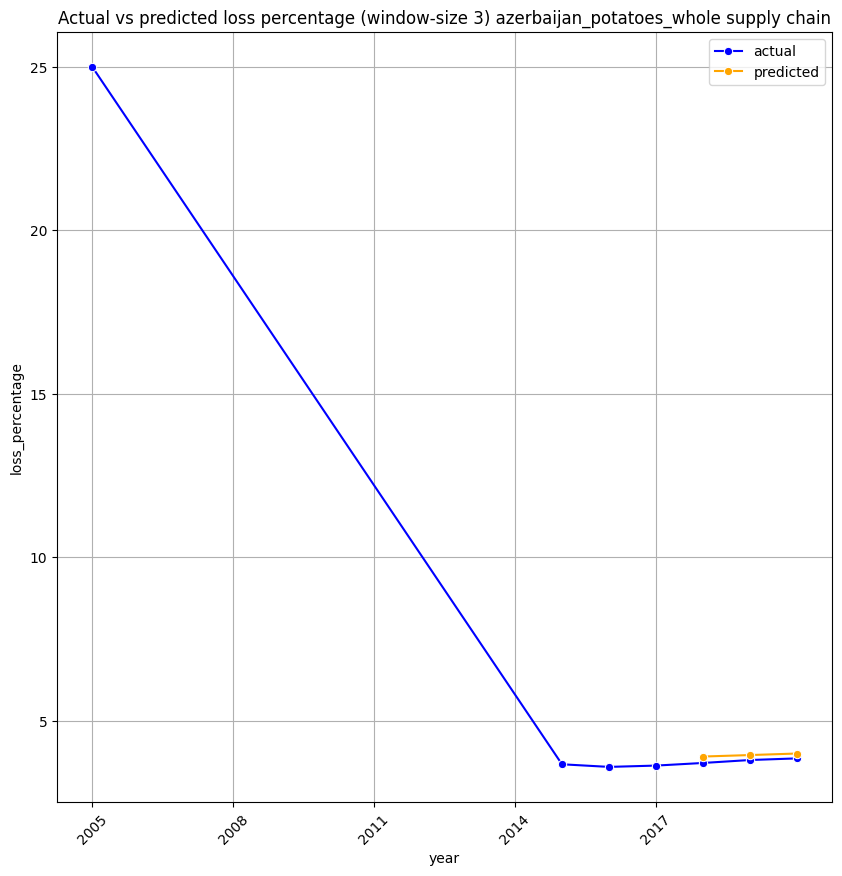

 66%|██████▌   | 29/44 [14:53<07:09, 28.62s/it]

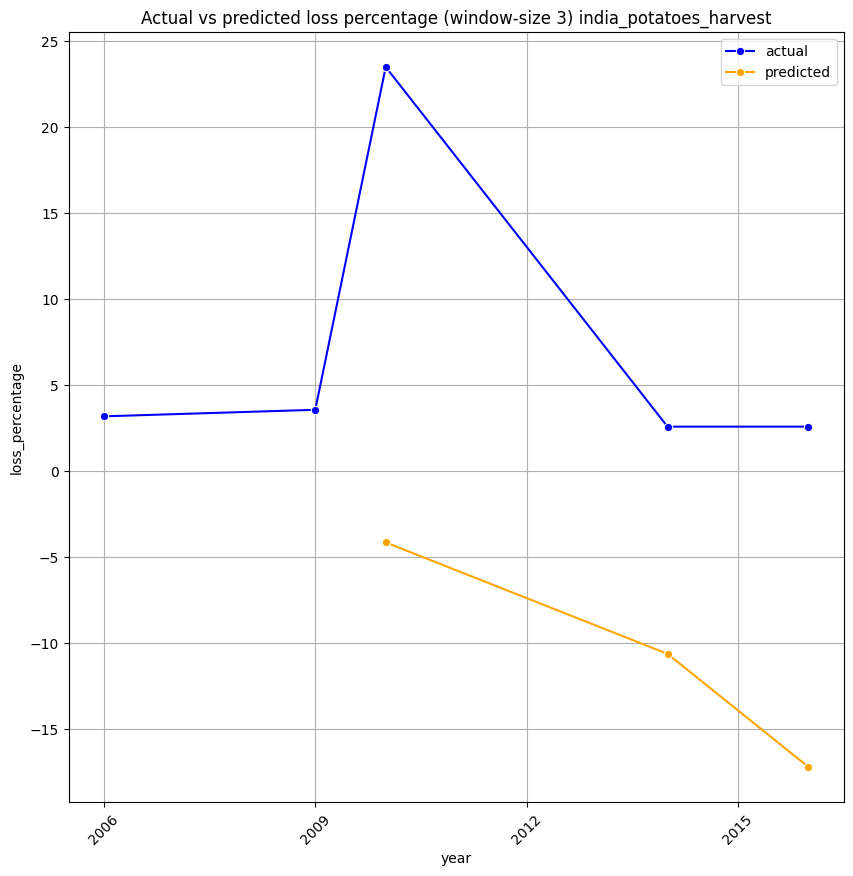

 68%|██████▊   | 30/44 [15:18<06:26, 27.64s/it]

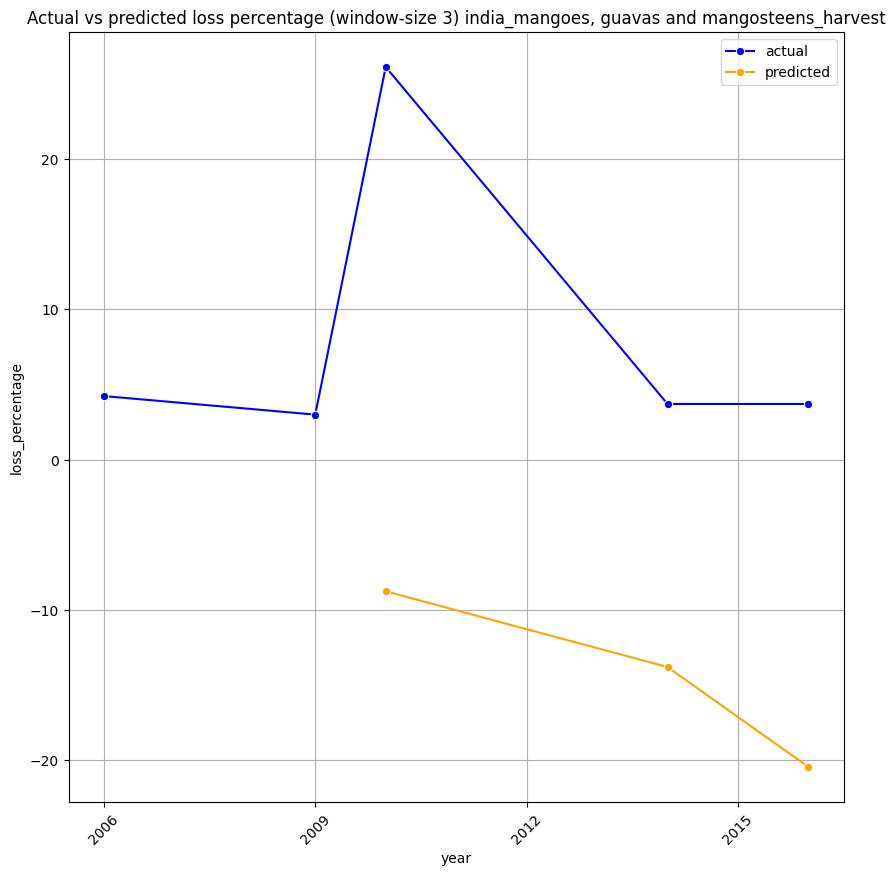

 70%|███████   | 31/44 [15:47<06:04, 28.03s/it]

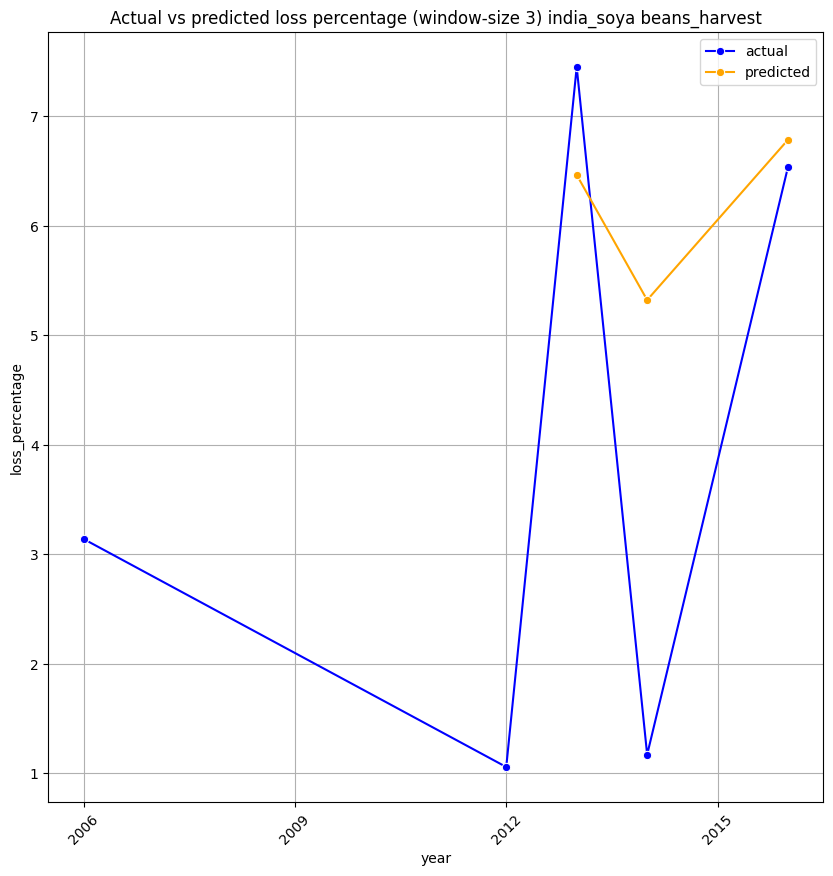

 73%|███████▎  | 32/44 [16:12<05:26, 27.18s/it]

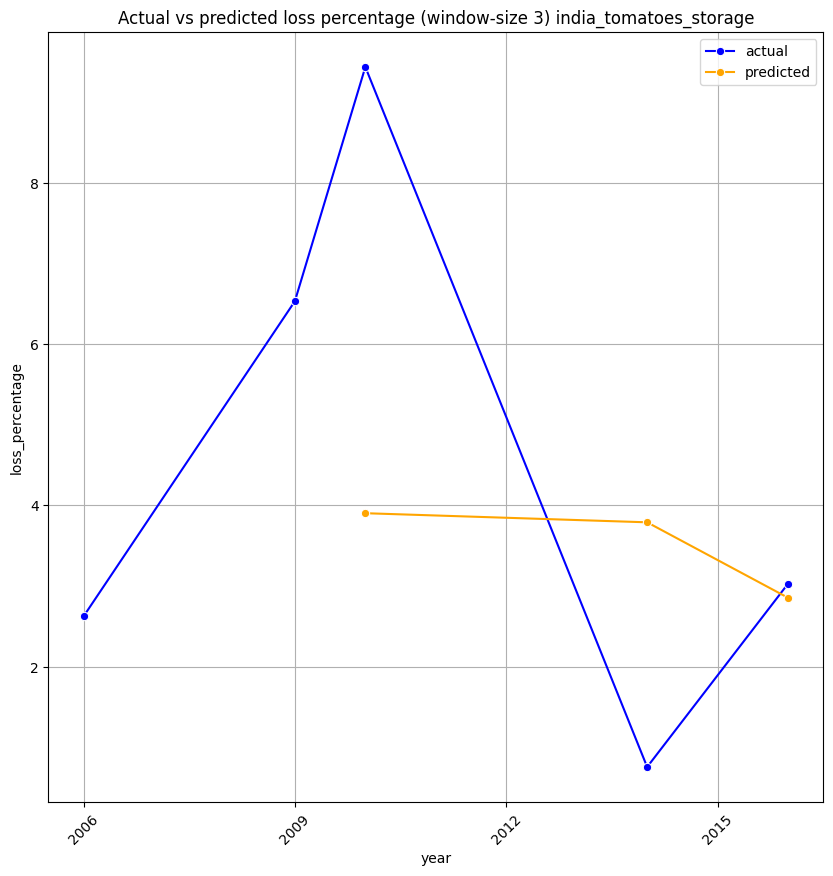

 75%|███████▌  | 33/44 [16:41<05:04, 27.72s/it]

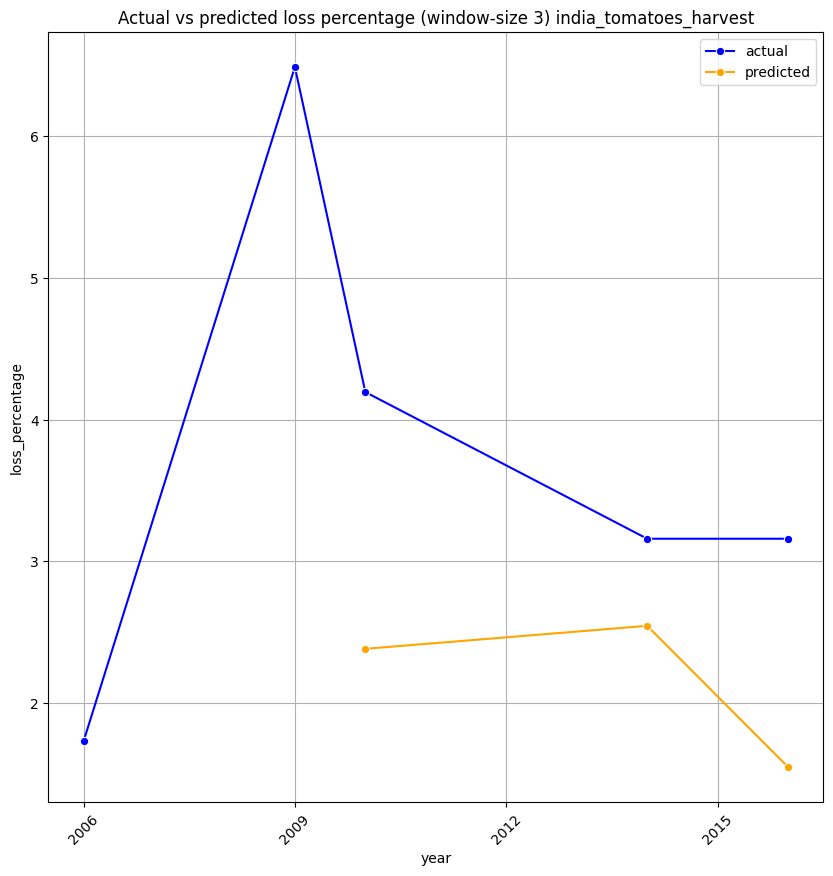

 77%|███████▋  | 34/44 [17:07<04:31, 27.17s/it]

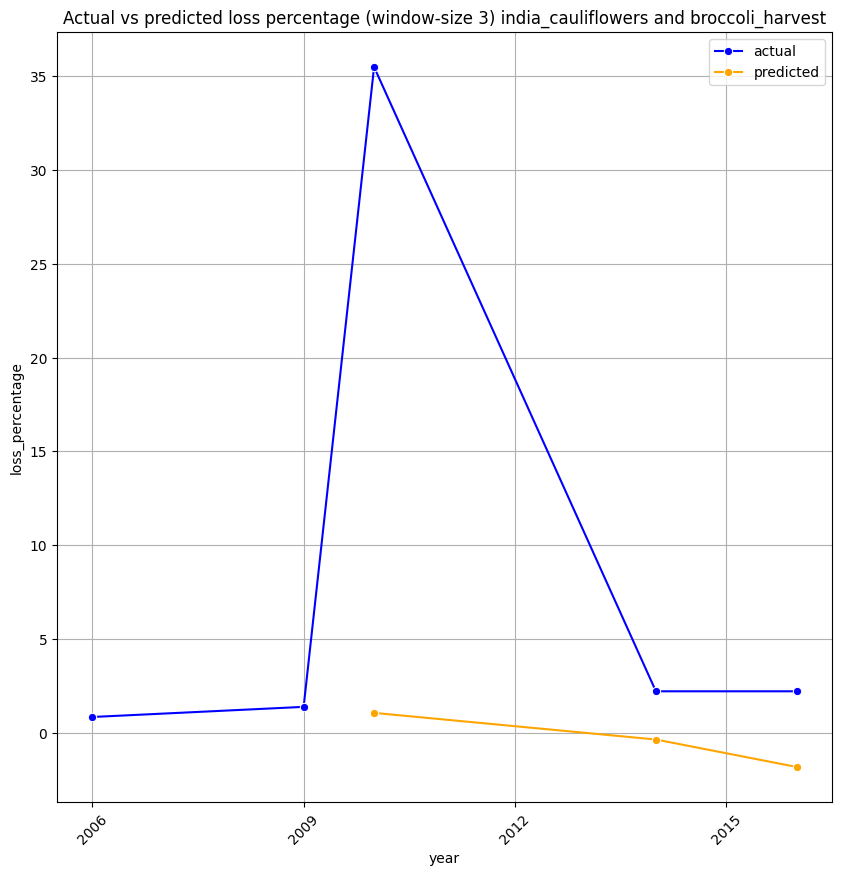

 80%|███████▉  | 35/44 [17:38<04:15, 28.42s/it]

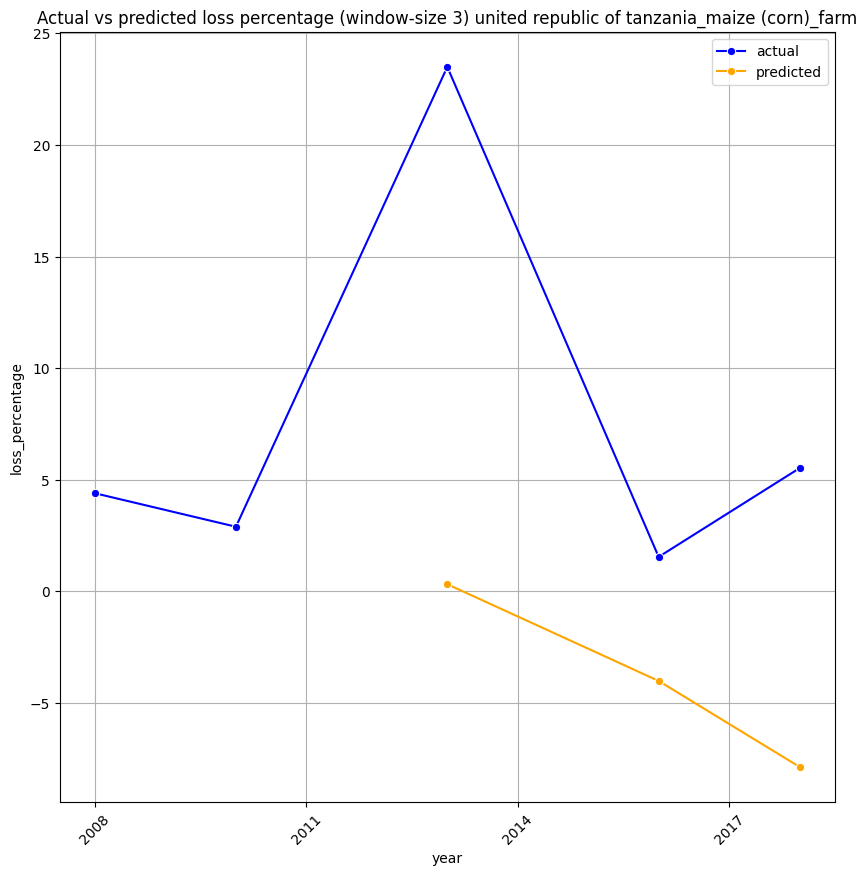

 82%|████████▏ | 36/44 [18:05<03:43, 27.93s/it]

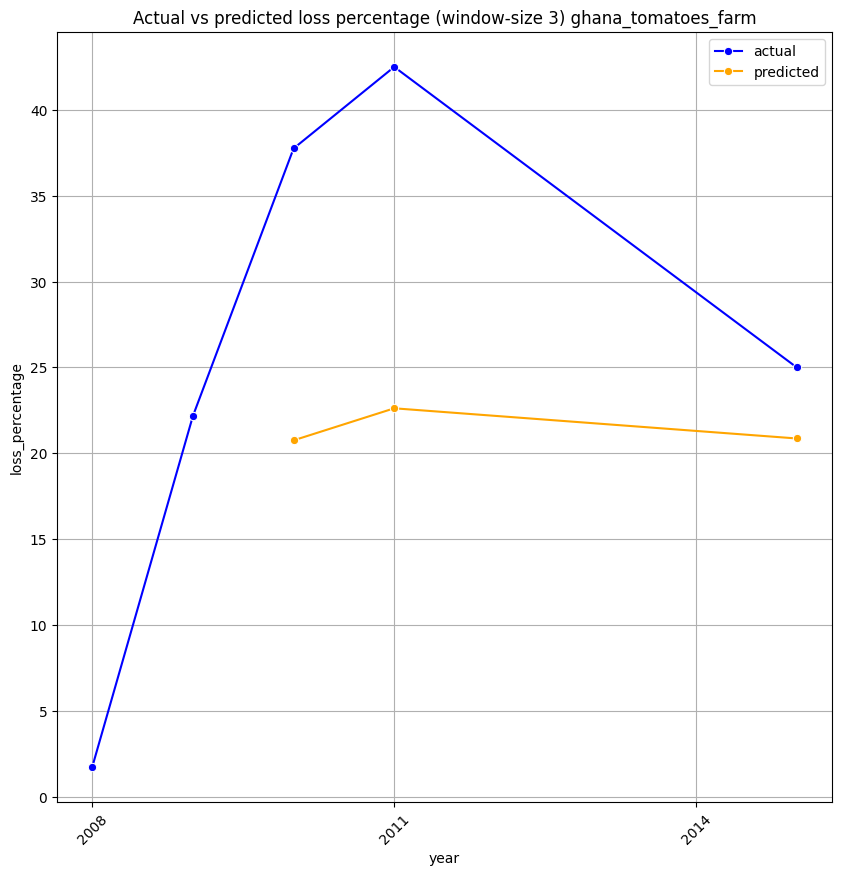

 84%|████████▍ | 37/44 [18:37<03:24, 29.24s/it]

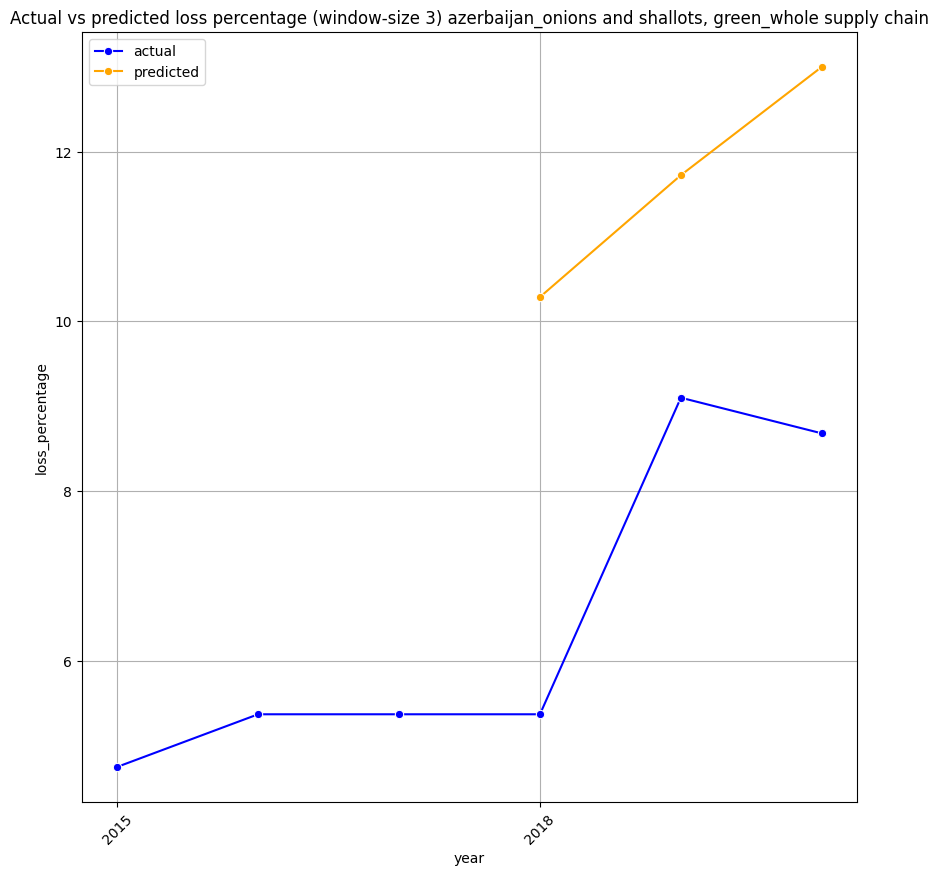

 86%|████████▋ | 38/44 [19:05<02:52, 28.67s/it]

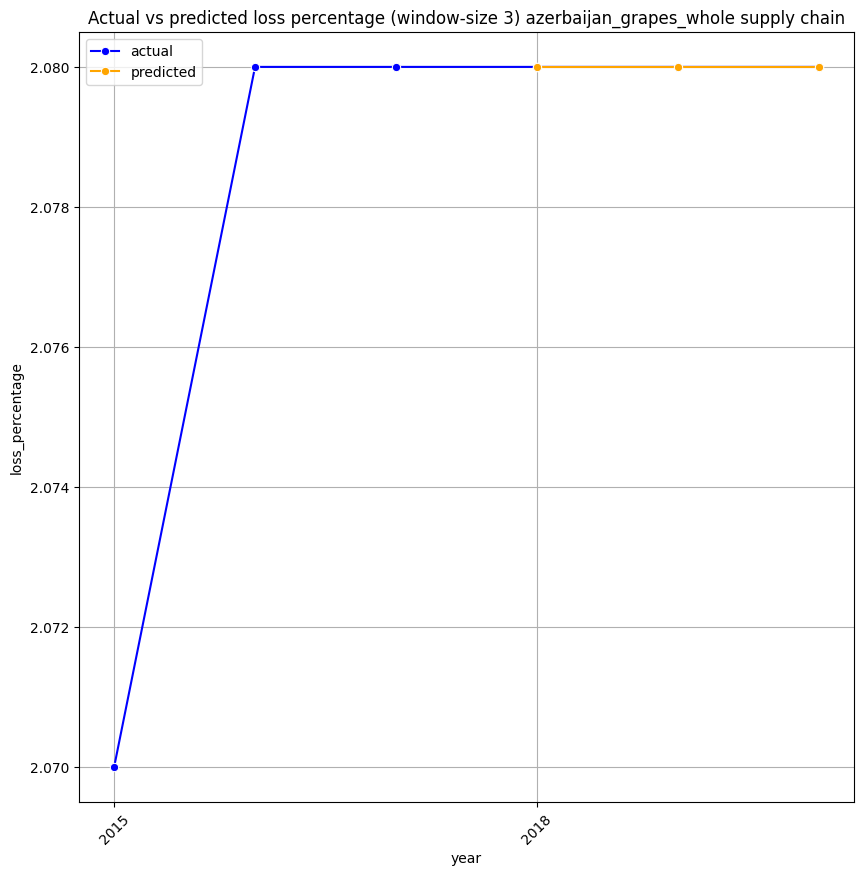

 89%|████████▊ | 39/44 [19:38<02:29, 29.92s/it]

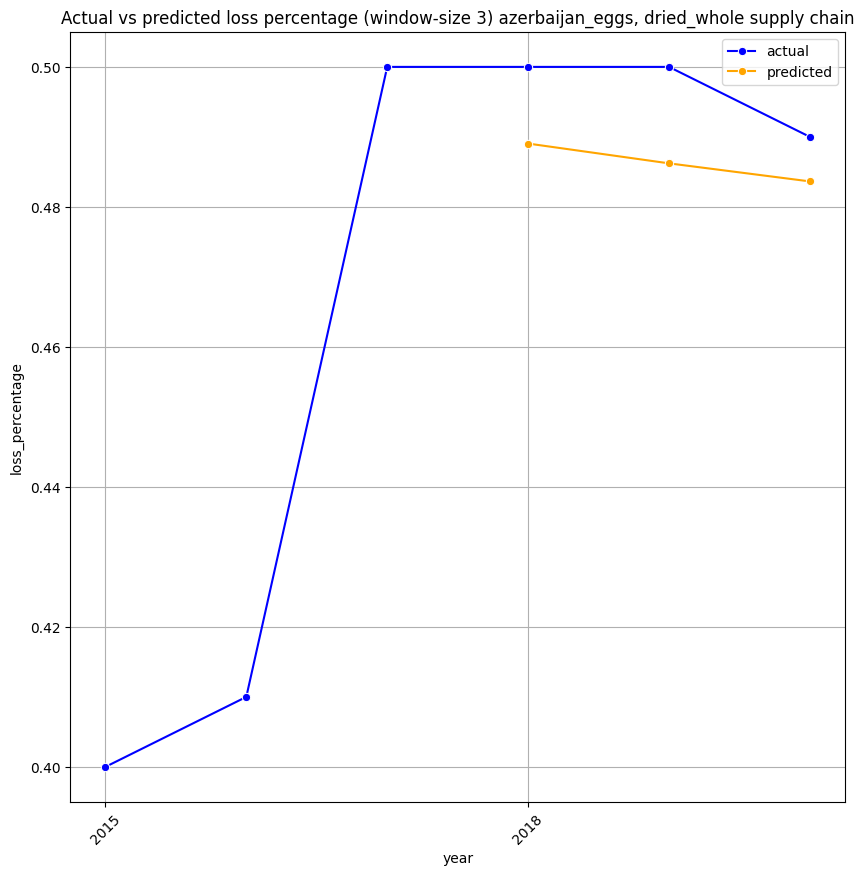

 91%|█████████ | 40/44 [20:04<01:56, 29.00s/it]

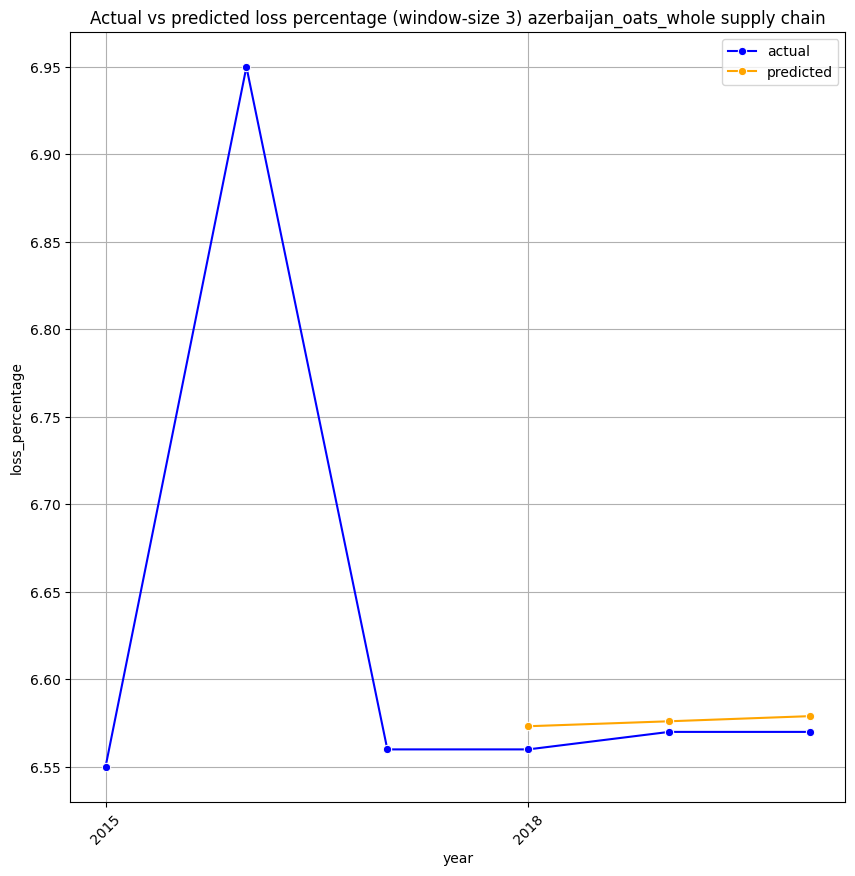

 93%|█████████▎| 41/44 [20:37<01:29, 29.94s/it]

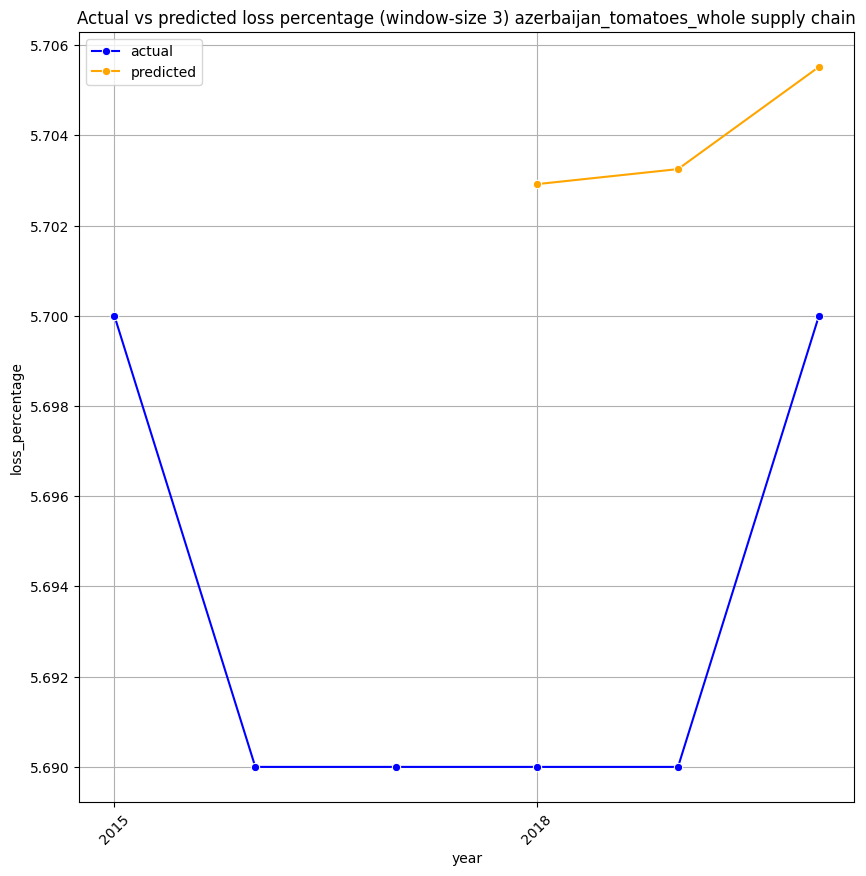

 95%|█████████▌| 42/44 [21:03<00:57, 28.89s/it]

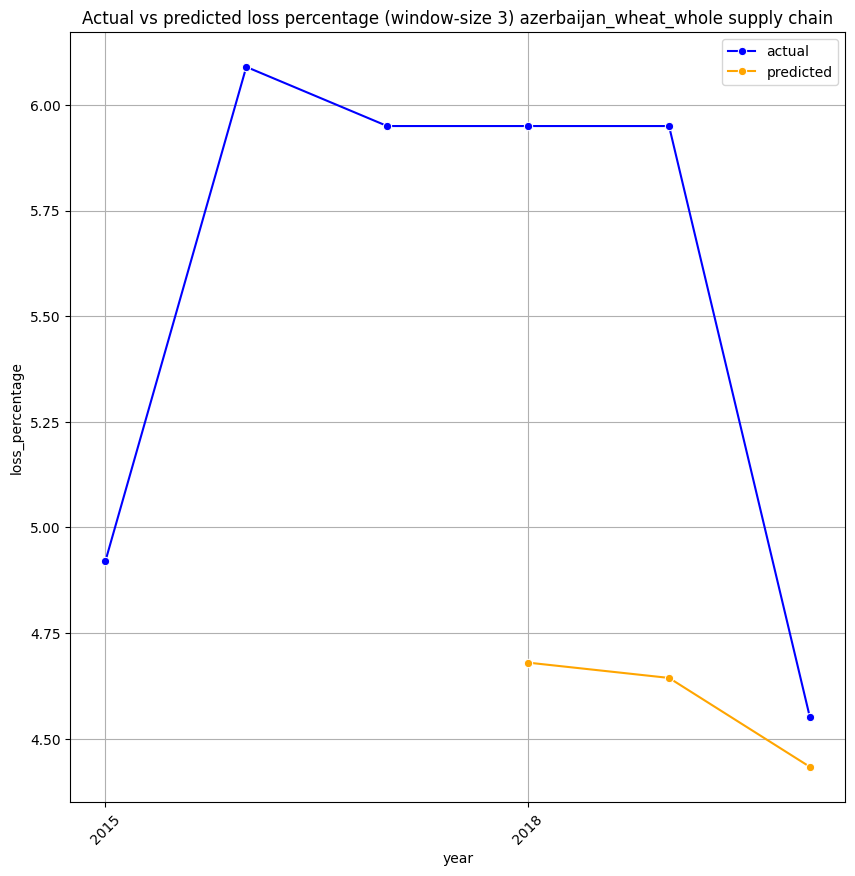

 98%|█████████▊| 43/44 [21:30<00:28, 28.36s/it]

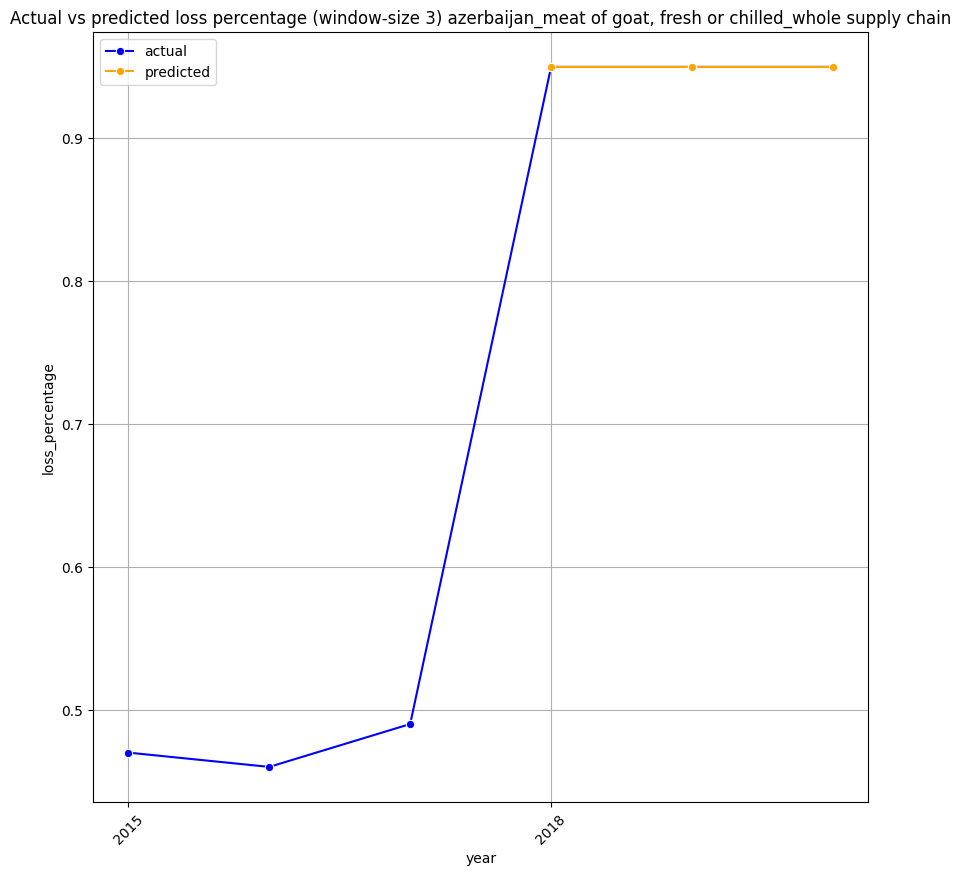

100%|██████████| 44/44 [22:02<00:00, 30.06s/it]


In [48]:
# Running the STS model on all keys


predictions = []
actuals = []

predictions_10 = []
actuals_10 = []

for key in tqdm(modeling_data.main_key.unique()):
  key_data = modeling_data[modeling_data.main_key == key]

  # Using all but the final 3 timesteps to train
  sample_data = key_data.loss_percentage[-3:]
  sample_model = build_model(sample_data)

  variational_posteriors = tfp.sts.build_factored_surrogate_posterior(
    model=sample_model)

  num_variational_steps = 100

  # Build and optimize the variational loss function
  elbo_loss_curve = tfp.vi.fit_surrogate_posterior(
      target_log_prob_fn=sample_model.joint_distribution(
          observed_time_series=sample_data).log_prob,
      surrogate_posterior=variational_posteriors,
      optimizer=tf.optimizers.Adam(learning_rate=0.01),
      num_steps=num_variational_steps,
      jit_compile=True)

  # Draw samples from the variational posterior
  q_samples_loss_ = variational_posteriors.sample(50)

  # Obtain sample forecasting distribution to sample from

  sample_forecast_dist = tfp.sts.forecast(
    sample_model,
    observed_time_series=sample_data,
    parameter_samples=q_samples_loss_,
    num_steps_forecast=3)

  num_samples=10

  sample_forecast_mean, sample_forecast_scale, sample_forecast_samples = (
      sample_forecast_dist.mean().numpy()[..., 0],
      sample_forecast_dist.stddev().numpy()[..., 0],
      sample_forecast_dist.sample(num_samples).numpy()[..., 0])

  plt.figure(figsize = (10,10))
  plt.title(f"Actual vs predicted loss percentage (window-size 3) {key}")
  sns.lineplot(x = key_data.year,
             y = key_data.loss_percentage,
             marker = "o", color = "blue", label = "actual")
  sns.lineplot(x = key_data.year[-3:],
              y = sample_forecast_mean,
              marker = "o", color = "orange", label = "predicted")
  plt.xticks(range(min(key_data.year),max(key_data.year),3), rotation = 45)
  plt.grid()
  plt.show()

  if len(key_data) >= 10:
    predictions_10.append(sample_forecast_mean)
    actuals_10.append(key_data.loss_percentage[-3:])

  predictions.append(sample_forecast_mean)
  actuals.append(key_data.loss_percentage[-3:])





In [49]:
print("Inferred parameters:")
for param in sample_model.parameters:
  print("{}: {} +- {}".format(param.name,
                              np.mean(q_samples_loss_[param.name], axis=0),
                              np.std(q_samples_loss_[param.name], axis=0)))

Inferred parameters:
observation_noise_scale: 4.0164111486057586e-17 +- 8.137450986305175e-19
ARIMA/_ar_coefficients: [ 0.46432047 -0.00203259  0.02031641] +- [0.01800768 0.02454297 0.02124796]
ARIMA/_ma_coefficients: [-0.01194504  0.01183369  0.67134329] +- [0.02600759 0.02252146 0.02701977]
ARIMA/_level_scale: 1.6597134263436417 +- 0.020892990345860542
LocalLinearTrend/_level_scale: 9.220403464332287e-17 +- 1.9638122650604475e-18
LocalLinearTrend/_slope_scale: 1.4535463177541358e-17 +- 3.617562414162711e-19


In [50]:
predictions_10 = sum([], predictions_10)
actuals_10 = sum([], actuals_10)

predictions = sum([], predictions)
actuals = sum([], actuals)

In [51]:
print(f'RMSE long series = {np.round(np.sqrt(mean_squared_error(predictions_10, actuals_10)),2)} | MAPE = {np.round(100*mean_absolute_percentage_error(predictions_10, actuals_10),2)}% | R-squared = {np.round(r2_score(predictions_10, actuals_10),2)}')
print(f'RMSE all series = {np.round(np.sqrt(mean_squared_error(predictions, actuals)),2)} | MAPE = {np.round(100*mean_absolute_percentage_error(predictions, actuals),2)}% | R-squared = {np.round(r2_score(predictions, actuals),2)}')

RMSE long series = 11.33 | MAPE = 94.86% | R-squared = 0.66
RMSE all series = 12.52 | MAPE = 171.81% | R-squared = 0.17
